# CNN image compression experiment
## Arpad Fodor
> How does an image classifier convolutional neural network responds to different image compression (JPEG encoding, bilinear interpolation) methods? This notebook is looking for an answer.

## 1. MISC
> Imports, CUDA check, etc.

In [ ]:
!pip3 install torch torchvision Pillow

In [ ]:
%matplotlib inline

import torch
import torch.nn as nn
import numpy as np
import random
import collections
import matplotlib
import matplotlib.pyplot as plt
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch.optim as optim

from copy import copy
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchsummary import summary
from torch.optim import lr_scheduler
from io import BytesIO
from PIL import Image

In [ ]:
!nvcc --version
haveCuda = torch.cuda.is_available()
print(haveCuda)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0
True


## 2. Prepare the dataset
> I used the Caltech-UCSD Birds-200-2011 dataset. As there is no public download link that I could use with wget, I have downloaded the whole dataset to my computer and selected 6 classes. Then, I zipped the subset and uploaded to Colaboratory. In the following part, I worked with that data.

In [ ]:
# -qq: do not log all files
!unzip -qq birds-subset.zip

replace birds-subset/012.Yellow_headed_Blackbird/Yellow_Headed_Blackbird_0003_8337.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
validation_ratio = 0.1
batch_size = 32
num_classes = 6

In [ ]:
dataset = torchvision.datasets.ImageFolder(root="birds-subset/")
print(dataset.classes)

['012.Yellow_headed_Blackbird', '030.Fish_Crow', '046.Gadwall', '054.Blue_Grosbeak', '066.Western_Gull', '130.Tree_Sparrow']


In [ ]:
# split to subsets
validation_size = int(validation_ratio * len(dataset))
train_size = int(len(dataset) - validation_size)

validation, train = torch.utils.data.random_split(dataset, [validation_size, train_size])
''' This is not a nice solution, but as PyTorch subsets share the same dataset object,
    I have to create a different one for validation to apply different data transformation.
    I do not want to use augmentation on the validation set.
'''
validation.dataset = copy(dataset)

In [ ]:
# augmentation - as there are really few images per class, augmentation is applied
train_transform = transforms.Compose(
    [
     transforms.Resize((200, 200)),
     transforms.RandomCrop((200, 200), padding=10, pad_if_needed=True),
     transforms.RandomHorizontalFlip(),
     transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.25),
     transforms.ToTensor(),
     # normalization is not needed here as the images are already loaded in the range of [0, 1)
    ]
)
train.dataset.transform = train_transform

# validation set has no augmentation
validation_transform = transforms.Compose(
    [
     transforms.Resize((200, 200)),
     transforms.ToTensor(),
     # normalization is not needed here as the images are already loaded in the range of [0, 1)
    ]
)
validation.dataset.transform = validation_transform

In [ ]:
# during training, shuffle images for optimal gradient updates (not to be biased towards the last class for example)
train_loader = DataLoader(train, batch_size=batch_size, shuffle=True, drop_last=True)
# shuffle is not needed here
validation_loader = DataLoader(validation, batch_size=batch_size, shuffle=False, drop_last=True)

In [ ]:
def show_num_classes(data_loader):
    
    num_classes = {
        0: 0,
        1: 0,
        2: 0,
        3: 0,
        4: 0,
        5: 0
    }

    for images, labels in data_loader:
        for label in labels:
            num_classes[label.item()] += 1

    print(num_classes)
    plt.bar(range(len(num_classes)), list(num_classes.values()), align='center')
    plt.xticks(range(len(num_classes)), list(data_loader.dataset.dataset.classes), rotation = 90)
    plt.show()

Training classes:
{0: 51, 1: 53, 2: 55, 3: 55, 4: 54, 5: 52}


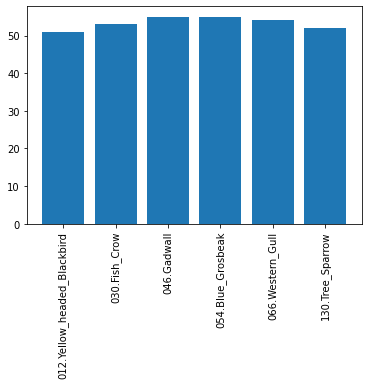

Validation classes:
{0: 4, 1: 7, 2: 3, 3: 5, 4: 6, 5: 7}


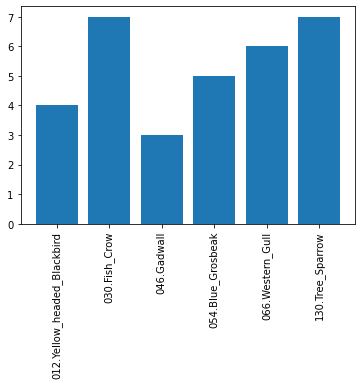

In [ ]:
print(f"Training classes:")
show_num_classes(train_loader)

print(f"Validation classes:")
show_num_classes(validation_loader)

In [ ]:
def show_samples(dataset):
    figure = plt.figure(figsize=(16, 8))
    cols, rows = 4, 2
    for i in range(1, cols * rows + 1):
        sample_idx = torch.randint(len(dataset), size=(1,)).item()
        img, label = dataset[sample_idx]
        figure.add_subplot(rows, cols, i)
        plt.title(dataset.dataset.classes[label])
        plt.axis("off")
        plt.imshow(img.squeeze().permute(1,2,0))
    plt.show()

Training set (uses augmentation):


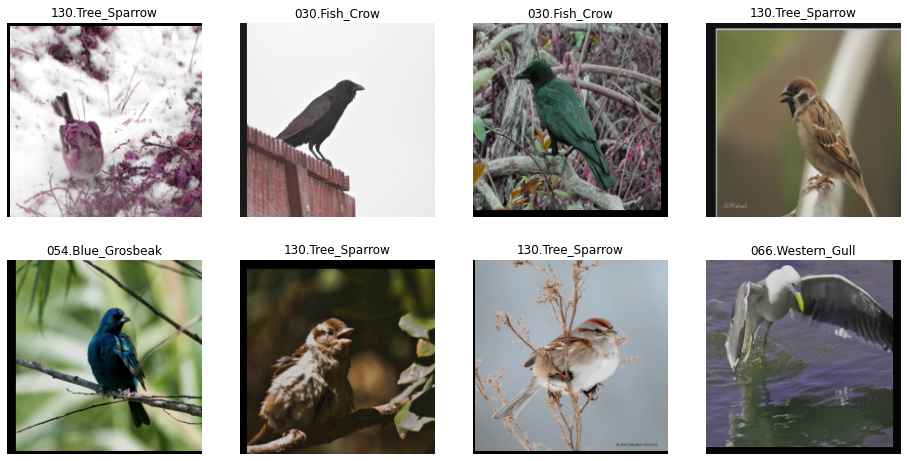

Validation set (no augmentation):


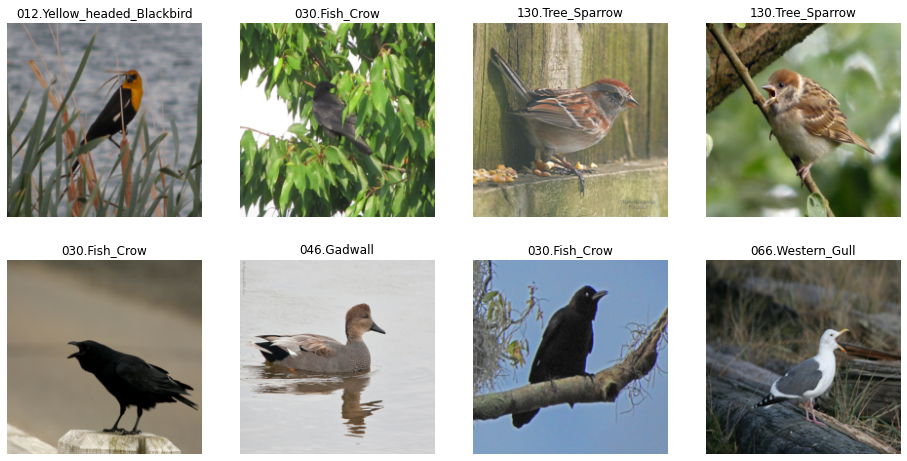

In [ ]:
print("Training set (uses augmentation):")
show_samples(train)
print("Validation set (no augmentation):")
show_samples(validation)

## 3. Model definitions
> Definition of building blocks and the model.

#### Custom convolutional layer
>To avoid boilerplate layer chaining, a custom convolutional layer is defined. It contains the following layers: convolution, batch normalization, dropout.

In [ ]:
class Conv(nn.Module):

  def __init__(self, in_channel, out_channel, kernel_size=3, stride=1, activation="relu", batchnorm_needed=True, dropout=0.2):

    super(Conv, self).__init__()

    #init layers
    self.conv = None
    self.activation = None
    self.bn = None
    self.dropout = nn.Dropout2d(p=dropout)

    # set activation
    if (activation == "hardswish"):
        self.activation = nn.Hardswish()
    elif (activation == "sigmoid"):
        self.activation = nn.Sigmoid()
    elif (activation == "relu"):
        self.activation = nn.ReLU()
    elif (activation == "relu6"):
        self.activation = nn.ReLU6()
    elif (activation == "leaky relu"):
        self.activation = nn.LeakyReLU()
    else:
        self.activation = None

    # batch normalization
    if (batchnorm_needed):
        # bias is False, because batch norm already adds a constant
        self.conv = nn.Conv2d(in_channel, out_channel, kernel_size=kernel_size, padding=(kernel_size // 2), stride=stride, bias=False)
        self.bn = nn.BatchNorm2d(out_channel)
    else:
        # bias is needed
        self.conv = nn.Conv2d(in_channel, out_channel, kernel_size=kernel_size, padding=(kernel_size // 2), stride=stride, bias=True)

  def forward(self, x):
    x = self.conv(x)
    x = self.dropout(x)
    if (self.activation != None):
        x = self.activation(x)
    if (self.bn != None):
        x = self.bn(x)
    return x

#### Custom Blur Pool layer 
>To make the network shift-invariant (https://arxiv.org/pdf/1904.11486.pdf). This implementation is from https://github.com/adobe/antialiased-cnns/blob/d4bf038a24cb2cdeae721ccaeeb1bd0c81c8dff7/antialiased_cnns/blurpool.py.

In [ ]:
class Blur_Pool(nn.Module):

    def __init__(self, channels, pad_type='zero', kernel_size=3, stride=2, pad_off=0):
        super(Blur_Pool, self).__init__()

        self.kernel_size = kernel_size
        self.pad_off = pad_off
        self.pad_sizes = [int(1.0 * (kernel_size-1)/2), int(np.ceil(1.0 * (kernel_size-1)/2)), int(1.0 * (kernel_size-1)/2), int(np.ceil(1.0 * (kernel_size-1)/2))]
        self.pad_sizes = [pad_size + pad_off for pad_size in self.pad_sizes]
        self.stride = stride
        self.off = int((self.stride-1) / 2.0)
        self.channels = channels

        if (self.kernel_size == 1):
            f = np.array([1.0,])
        elif (self.kernel_size == 2):
            f = np.array([1.0, 1.0])
        elif (self.kernel_size == 3):
            f = np.array([1.0, 2.0, 1.0])
        elif (self.kernel_size == 4):    
            f = np.array([1.0, 3.0, 3.0, 1.0])
        elif (self.kernel_size == 5):    
            f = np.array([1.0, 4.0, 6.0, 4.0, 1.0])
        elif (self.kernel_size == 6):    
            f = np.array([1.0, 5.0, 10.0, 10.0, 5.0, 1.0])
        elif (self.kernel_size == 7):    
            f = np.array([1.0, 6.0, 15.0, 20.0, 15.0, 6.0, 1.0])

        kernel = torch.Tensor(f[:,None] * f[None,:])
        kernel = kernel / torch.sum(kernel)
        self.register_buffer('kernel', kernel[None,None,:,:].repeat((self.channels, 1, 1, 1)))

        self.pad = self.get_pad_layer(pad_type)(self.pad_sizes)

    def get_pad_layer(self, pad_type):
        if (pad_type in ['refl','reflect']):
            PadLayer = nn.ReflectionPad2d
        elif (pad_type in ['repl','replicate']):
            PadLayer = nn.ReplicationPad2d
        elif (pad_type=='zero'):
            PadLayer = nn.ZeroPad2d
        else:
            print(f"Pad type {pad_type} is not recognized")
        return PadLayer

    def forward(self, input):
        if (self.kernel_size==1):
            if (self.pad_off==0):
                return input[:,:,::self.stride,::self.stride]    
            else:
                return self.pad(input)[:,:,::self.stride,::self.stride]
        else:
            return nn.functional.conv2d(self.pad(input), self.kernel, stride=self.stride, groups=input.shape[1])

#### Custom Residual block
> To avoid the vanishing gradient problem, a block of convolutional layers is defined with skip connection between its input and its output. That means, the input directly influences the output, not just the conv activations. Number of conv layers in a block can be defined with a parameter. The number of channels is identical in a block, only the last layer of the block does spatial scaling down & channel scaling up (by a factor of 2).

In [ ]:
class Residual_Block(nn.Module):

    def __init__(self, in_channel, out_channel, kernel_size=3, stride=1, activation="relu", batchnorm_needed=True, dropout=0.2, num_layers=1, residual=True):
        super(Residual_Block, self).__init__()
        self.residual_needed = residual
        self.residual_part = nn.Sequential()
        # num_layers convolutional layers in a residual block
        for i in range(num_layers):
            self.residual_part.add_module(f"Conv{i+1}", Conv(in_channel, in_channel, kernel_size, stride, activation, batchnorm_needed, dropout))
        # spatial downscaling + channel upscaling with stride 1 convolution + blur pooling
        self.channel_upscale = Conv(in_channel, out_channel, kernel_size, 2, activation, batchnorm_needed, 0)
        self.spatial_downscale = Blur_Pool(out_channel, pad_type='zero', kernel_size=kernel_size, stride=2, pad_off=0)

    def forward(self, input):
        result = self.residual_part(input)
        # residual connection 
        if (self.residual_needed):
            result += input
        result = self.channel_upscale(result)
        return self.spatial_downscale(result)

#### Model definition
> The model can be defined by its constructor parameters. The first convolution layer applies a kernel size of 7 as the benchmark CNN (ResNet-50) uses the same size.

In [ ]:
class Model(nn.Module):

    def __init__(self, num_classes, num_features, num_residual_blocks, layers_per_level, kernel_size, activation, batchnorm_needed, residual_needed, stride, dropout):

        super(Model, self).__init__()

        # input image is RGB, so in_channel starts from 3
        in_channel = 3
        out_channel = num_features

        self.blocks = nn.Sequential()
        # first conv layer to create in_channel -> num_features channels
        self.blocks.add_module(f"Conv1", Conv(in_channel, out_channel, 7, 1, activation, batchnorm_needed, dropout))
        # num_residual_blocks residual blocks needed
        for i in range(num_residual_blocks):
            in_channel = out_channel
            out_channel *= 2
            self.blocks.add_module(f"ResidualBlock{i+1}", Residual_Block(in_channel, out_channel, kernel_size, stride, activation, batchnorm_needed, dropout, layers_per_level, residual_needed))

        # handle different in channels (caused by the possibly different number of layers)
        self.adaptive = nn.AdaptiveAvgPool2d((1, 1))
        # classifier with convolution layer
        self.classifier = nn.Conv2d(out_channel, num_classes, 1)

    def forward(self, input):
        x = self.blocks(input)
        x = self.adaptive(x)
        x = self.classifier(x)
        # remove 1 sized dimensions from the tensor
        return torch.squeeze(x)

## 4. Training methods
> Helper methods to implement the image classification training, and plot the results.

#### Progress Bar

In [ ]:
from IPython.display import HTML, display

def progress(value, max=100):
    return HTML("""
        <progress
            value='{value}'
            max='{max}',
            style='width: 100%'
        >
            {value}
        </progress>
    """.format(value=value, max=max))

#### Confusion matrix

In [ ]:
def ConfusionMatrix(matrix, predicted, labels):
    for label, pred in zip(labels, predicted):
        matrix[label, pred] += 1

#### Training

In [ ]:
def train(model, data_loader, epoch, cost_fn, optimizer):

    running_loss = 0.0
    correct = 0.0
    total = 0

    # set training mode
    model.train()

    # create progress bar
    bar = display(progress(0, len(data_loader)), display_id=True)

    # 1 epoch training
    for i, data in enumerate(data_loader):

        inputs, labels = data
        # cuda support (fallback if GPU is not available)
        if haveCuda:
            inputs, labels = inputs.cuda(), labels.cuda()

        # zero out gradients
        optimizer.zero_grad()
        # model inference
        outputs = model(inputs)
        # calculate loss with cost function
        try:
            loss = cost_fn(outputs, labels)
        except:
            print(outputs.shape)
            print(labels.unsqueeze(1).shape)
        # backpropagate loss
        loss.backward()
        # update gradients based on the loss
        optimizer.step()

        # update running loss, use .item() to avoid memory leak
        running_loss += loss.item()
        # pred_indices: indices of the predicted classes
        max_values, pred_indices = torch.max(outputs, 1)
        # .item() to avoid memory leak
        correct += (pred_indices == labels).sum().item()
        # epoch size instance is added to the total
        total += labels.shape[0]

        # update progress bar
        bar.update(progress(i+1, len(data_loader)))

    training_loss = running_loss / len(data_loader)
    training_acc = (correct / total) * 100
    print(f"Train epoch {epoch+1} - loss: {training_loss} accuracy: {training_acc}")

    return training_loss, training_acc

#### Validation

In [ ]:
def validate(model, data_loader, epoch, cost_fn, num_classes, show_progress=True):

    running_loss = 0.0
    correct = 0.0
    total = 0
    # initialize confusion matrix with zeros
    matrix = torch.zeros(num_classes, num_classes)
  
    # disable model training mode
    model.eval()

    if (show_progress):
        # create progress bar
        bar = display(progress(0, len(data_loader)), display_id=True)

    for i, data in enumerate(data_loader):

        inputs, labels = data
        # cuda support (fallback if GPU is not available)
        if haveCuda:
            inputs, labels = inputs.cuda(), labels.cuda()

        # gradient update & backprop is not needed during validation; optimizer related things are not needed
        with torch.no_grad():
            outputs = model(inputs)
            try:
                loss = cost_fn(outputs, labels)
            except:
                print(outputs.shape)
                print(labels.unsqueeze(1).shape)
        # update running loss, use .item() to avoid memory leak
        running_loss += loss.item()
        # pred_indices: indices of the predicted classes
        max_values, pred_indices = torch.max(outputs, 1)
        # .item() to avoid memory leak
        correct += (pred_indices == labels).sum().item()
        # epoch size instance is added to the total
        total += labels.shape[0]
        # update confusion matrix
        ConfusionMatrix(matrix, pred_indices, labels)

        if (show_progress):
            # update progress bar
            bar.update(progress(i+1, len(data_loader)))

    validation_loss = running_loss / len(data_loader)
    validation_acc = (correct / total) * 100
    
    if (show_progress):
        print(f"Valid epoch {epoch+1} - loss: {validation_loss} accuracy: {validation_acc}")

    return validation_loss, validation_acc, matrix

#### Training activity
> Wrap training and validation, save best model checkpoints, plot results.

In [ ]:
def training_activity(model, train_loader, validation_loader, num_classes, cost_function, lr=1e-3, lr_ratio=1e-6, numEpoch=100, decay=1e-4):

    random.seed(42)
    torch.manual_seed(42)

    # cost function & optimization function
    cost_fn = cost_function
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=decay)

    # LR cheduler - eta_min is the min learning rate at the end
    scheduler = lr_scheduler.CosineAnnealingLR(optimizer, numEpoch, eta_min=lr_ratio)

    # training administration
    num_epoch = numEpoch
    train_loss = []
    train_acc = []
    val_loss = []
    val_acc = []

    best_acc = torch.zeros(1)

    for epoch in range(numEpoch):

        # training & validation
        tr_loss, tr_acc = train(model, train_loader, epoch, cost_fn, optimizer)
        v_loss, v_acc, matrix = validate(model, validation_loader, epoch, cost_fn, num_classes)
        # save current results
        train_loss.append(tr_loss)
        train_acc.append(tr_acc)
        val_loss.append(v_loss)
        val_acc.append(v_acc)

        # scheduler step
        scheduler.step()

        # save the model if it is better than the previous best
        if v_acc > best_acc:
            best_acc = v_acc
            print(f"New best model. Accuracy: {best_acc}")
            torch.save(model, "/model.pth")
            print(f"New best model saved.")
            print(matrix)

    # Finished
    print('Training finished.')
    plt.plot(train_loss)
    plt.plot(val_loss)
    plt.show()
    plt.plot(train_acc)
    plt.plot(val_acc)
    plt.show()
    print(f"Best accuracy: {best_acc}")

    return best_acc

## 5. Build model
> Specify parameters to build the model with.

In [ ]:
# number of out classes
num_features = 64
num_residual_blocks = 3
layers_per_level = 3
kernel_size = 3
activation = "relu6"
batchnorm_needed = True
residual_needed = True
stride = 1
dropout = 0.05

cost_function = nn.CrossEntropyLoss()

In [ ]:
model = Model(num_classes, num_features, num_residual_blocks, layers_per_level, kernel_size, activation, batchnorm_needed, residual_needed, stride, dropout)

if haveCuda:
    torch.cuda.manual_seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    model = model.cuda()

summary(model, (3, 200, 200))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 200, 200]           9,408
         Dropout2d-2         [-1, 64, 200, 200]               0
             ReLU6-3         [-1, 64, 200, 200]               0
       BatchNorm2d-4         [-1, 64, 200, 200]             128
              Conv-5         [-1, 64, 200, 200]               0
            Conv2d-6         [-1, 64, 200, 200]          36,864
         Dropout2d-7         [-1, 64, 200, 200]               0
             ReLU6-8         [-1, 64, 200, 200]               0
       BatchNorm2d-9         [-1, 64, 200, 200]             128
             Conv-10         [-1, 64, 200, 200]               0
           Conv2d-11         [-1, 64, 200, 200]          36,864
        Dropout2d-12         [-1, 64, 200, 200]               0
            ReLU6-13         [-1, 64, 200, 200]               0
      BatchNorm2d-14         [-1, 64, 2

## 6. Training
> The model is trained for 300 epochs with Adam optimizer. It could achieve `90.625%` validation accuracy & `89.0625%` train accuracy. The last plotted confusion matrix belongs to the best model (epoch `105`). The model was complex enough to overfit completely on the training set (accuracy is close to `100%` at the end of training). The best performing model on the validation set is used further.

Train epoch 1 - loss: 2.458188033103943 accuracy: 16.875


Valid epoch 1 - loss: 4.532149791717529 accuracy: 18.75
New best model. Accuracy: 18.75
New best model saved.
tensor([[0., 0., 0., 0., 4., 0.],
        [0., 0., 0., 0., 7., 0.],
        [0., 0., 0., 0., 3., 0.],
        [0., 0., 0., 0., 5., 0.],
        [0., 0., 0., 0., 6., 0.],
        [0., 0., 0., 0., 7., 0.]])


Train epoch 2 - loss: 1.7965651035308838 accuracy: 25.0


Valid epoch 2 - loss: 2.2894678115844727 accuracy: 12.5


Train epoch 3 - loss: 1.8000532865524292 accuracy: 24.375


Valid epoch 3 - loss: 1.828328013420105 accuracy: 28.125
New best model. Accuracy: 28.125
New best model saved.
tensor([[0., 2., 2., 0., 0., 0.],
        [0., 6., 0., 0., 0., 1.],
        [0., 2., 1., 0., 0., 0.],
        [1., 0., 2., 0., 1., 1.],
        [0., 4., 1., 0., 1., 0.],
        [0., 2., 4., 0., 0., 1.]])


Train epoch 4 - loss: 1.713396418094635 accuracy: 30.312499999999996


Valid epoch 4 - loss: 1.65613853931427 accuracy: 50.0
New best model. Accuracy: 50.0
New best model saved.
tensor([[1., 1., 2., 0., 0., 0.],
        [0., 5., 1., 1., 0., 0.],
        [0., 0., 3., 0., 0., 0.],
        [1., 0., 0., 3., 1., 0.],
        [0., 0., 2., 0., 4., 0.],
        [0., 1., 2., 4., 0., 0.]])


Train epoch 5 - loss: 1.6274597644805908 accuracy: 34.375


Valid epoch 5 - loss: 1.5975772142410278 accuracy: 34.375


Train epoch 6 - loss: 1.6089745163917542 accuracy: 32.8125


Valid epoch 6 - loss: 1.4703915119171143 accuracy: 53.125
New best model. Accuracy: 53.125
New best model saved.
tensor([[2., 0., 0., 1., 0., 1.],
        [0., 4., 0., 0., 0., 3.],
        [0., 0., 2., 0., 0., 1.],
        [2., 0., 0., 0., 1., 2.],
        [0., 0., 1., 1., 3., 1.],
        [0., 1., 0., 0., 0., 6.]])


Train epoch 7 - loss: 1.5858083605766295 accuracy: 33.75


Valid epoch 7 - loss: 1.4807791709899902 accuracy: 53.125


Train epoch 8 - loss: 1.631703531742096 accuracy: 31.5625


Valid epoch 8 - loss: 1.495598554611206 accuracy: 37.5


Train epoch 9 - loss: 1.5832075595855712 accuracy: 35.625


Valid epoch 9 - loss: 1.4325265884399414 accuracy: 50.0


Train epoch 10 - loss: 1.638066565990448 accuracy: 35.3125


Valid epoch 10 - loss: 1.5030176639556885 accuracy: 37.5


Train epoch 11 - loss: 1.5497374176979064 accuracy: 35.3125


Valid epoch 11 - loss: 1.4703736305236816 accuracy: 50.0


Train epoch 12 - loss: 1.5194362640380858 accuracy: 41.875


Valid epoch 12 - loss: 3.0201289653778076 accuracy: 21.875


Train epoch 13 - loss: 1.5941336035728455 accuracy: 35.3125


Valid epoch 13 - loss: 1.4014530181884766 accuracy: 46.875


Train epoch 14 - loss: 1.4912283658981322 accuracy: 37.8125


Valid epoch 14 - loss: 1.4790656566619873 accuracy: 56.25
New best model. Accuracy: 56.25
New best model saved.
tensor([[2., 0., 1., 1., 0., 0.],
        [0., 4., 0., 3., 0., 0.],
        [0., 0., 2., 0., 0., 1.],
        [0., 0., 0., 5., 0., 0.],
        [1., 0., 1., 0., 2., 2.],
        [0., 0., 1., 2., 1., 3.]])


Train epoch 15 - loss: 1.5203692674636842 accuracy: 39.375


Valid epoch 15 - loss: 1.3397389650344849 accuracy: 50.0


Train epoch 16 - loss: 1.4255496382713317 accuracy: 43.4375


Valid epoch 16 - loss: 1.4927749633789062 accuracy: 34.375


Train epoch 17 - loss: 1.4476533651351928 accuracy: 44.6875


Valid epoch 17 - loss: 1.4580600261688232 accuracy: 43.75


Train epoch 18 - loss: 1.4201255321502686 accuracy: 44.0625


Valid epoch 18 - loss: 1.02460777759552 accuracy: 56.25


Train epoch 19 - loss: 1.4573675751686097 accuracy: 37.8125


Valid epoch 19 - loss: 1.2242200374603271 accuracy: 59.375
New best model. Accuracy: 59.375
New best model saved.
tensor([[2., 0., 0., 1., 0., 1.],
        [1., 5., 0., 0., 1., 0.],
        [0., 0., 2., 0., 0., 1.],
        [0., 0., 0., 3., 0., 2.],
        [0., 2., 0., 1., 1., 2.],
        [0., 1., 0., 0., 0., 6.]])


Train epoch 20 - loss: 1.4343915939331056 accuracy: 43.125


Valid epoch 20 - loss: 1.362249493598938 accuracy: 43.75


Train epoch 21 - loss: 1.3710020780563354 accuracy: 45.625


Valid epoch 21 - loss: 1.3019963502883911 accuracy: 53.125


Train epoch 22 - loss: 1.4073576092720033 accuracy: 46.5625


Valid epoch 22 - loss: 2.862403631210327 accuracy: 28.125


Train epoch 23 - loss: 1.3936648607254027 accuracy: 45.3125


Valid epoch 23 - loss: 1.188884973526001 accuracy: 59.375


Train epoch 24 - loss: 1.3409534096717834 accuracy: 45.3125


Valid epoch 24 - loss: 1.2032500505447388 accuracy: 59.375


Train epoch 25 - loss: 1.3898836851119996 accuracy: 45.3125


Valid epoch 25 - loss: 1.1019736528396606 accuracy: 65.625
New best model. Accuracy: 65.625
New best model saved.
tensor([[3., 0., 0., 1., 0., 0.],
        [1., 5., 0., 1., 0., 0.],
        [0., 0., 2., 0., 1., 0.],
        [0., 0., 0., 3., 0., 2.],
        [0., 1., 0., 1., 3., 1.],
        [0., 1., 0., 1., 0., 5.]])


Train epoch 26 - loss: 1.3276851177215576 accuracy: 47.5


Valid epoch 26 - loss: 1.1260826587677002 accuracy: 62.5


Train epoch 27 - loss: 1.3602940082550048 accuracy: 44.6875


Valid epoch 27 - loss: 1.2276346683502197 accuracy: 53.125


Train epoch 28 - loss: 1.2923969626426697 accuracy: 47.5


Valid epoch 28 - loss: 1.1268346309661865 accuracy: 68.75
New best model. Accuracy: 68.75
New best model saved.
tensor([[3., 0., 0., 1., 0., 0.],
        [0., 6., 0., 0., 0., 1.],
        [0., 0., 3., 0., 0., 0.],
        [0., 0., 0., 2., 1., 2.],
        [0., 1., 1., 0., 4., 0.],
        [0., 0., 1., 0., 2., 4.]])


Train epoch 29 - loss: 1.324803650379181 accuracy: 49.6875


Valid epoch 29 - loss: 1.4824937582015991 accuracy: 50.0


Train epoch 30 - loss: 1.282384717464447 accuracy: 53.125


Valid epoch 30 - loss: 2.2988815307617188 accuracy: 25.0


Train epoch 31 - loss: 1.3079561471939087 accuracy: 48.4375


Valid epoch 31 - loss: 1.1473716497421265 accuracy: 56.25


Train epoch 32 - loss: 1.2791455864906311 accuracy: 50.625


Valid epoch 32 - loss: 0.9820595979690552 accuracy: 56.25


Train epoch 33 - loss: 1.2429507374763489 accuracy: 52.81249999999999


Valid epoch 33 - loss: 1.5426032543182373 accuracy: 59.375


Train epoch 34 - loss: 1.2001442611217499 accuracy: 55.625


Valid epoch 34 - loss: 1.1148422956466675 accuracy: 56.25


Train epoch 35 - loss: 1.1877467036247253 accuracy: 53.75


Valid epoch 35 - loss: 1.003042221069336 accuracy: 59.375


Train epoch 36 - loss: 1.1991438388824462 accuracy: 57.1875


Valid epoch 36 - loss: 0.9346944093704224 accuracy: 71.875
New best model. Accuracy: 71.875
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [0., 6., 0., 0., 0., 1.],
        [0., 0., 3., 0., 0., 0.],
        [0., 0., 0., 3., 0., 2.],
        [0., 0., 2., 0., 4., 0.],
        [0., 0., 3., 0., 1., 3.]])


Train epoch 37 - loss: 1.2203795194625855 accuracy: 55.3125


Valid epoch 37 - loss: 1.089827060699463 accuracy: 56.25


Train epoch 38 - loss: 1.2315760135650635 accuracy: 50.9375


Valid epoch 38 - loss: 0.8553630113601685 accuracy: 62.5


Train epoch 39 - loss: 1.1084222793579102 accuracy: 58.12500000000001


Valid epoch 39 - loss: 0.9933433532714844 accuracy: 65.625


Train epoch 40 - loss: 1.135702168941498 accuracy: 61.5625


Valid epoch 40 - loss: 1.404322862625122 accuracy: 53.125


Train epoch 41 - loss: 1.2252742767333984 accuracy: 53.125


Valid epoch 41 - loss: 1.034224271774292 accuracy: 56.25


Train epoch 42 - loss: 1.1121203541755675 accuracy: 59.06249999999999


Valid epoch 42 - loss: 1.1664780378341675 accuracy: 56.25


Train epoch 43 - loss: 1.1174414217472077 accuracy: 64.0625


Valid epoch 43 - loss: 0.8302776217460632 accuracy: 71.875


Train epoch 44 - loss: 1.0835097432136536 accuracy: 64.0625


Valid epoch 44 - loss: 0.7939360737800598 accuracy: 75.0
New best model. Accuracy: 75.0
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [2., 5., 0., 0., 0., 0.],
        [0., 0., 0., 0., 3., 0.],
        [0., 0., 0., 5., 0., 0.],
        [0., 0., 0., 0., 6., 0.],
        [0., 0., 0., 2., 1., 4.]])


Train epoch 45 - loss: 1.1008445858955382 accuracy: 62.5


Valid epoch 45 - loss: 0.8183627128601074 accuracy: 71.875


Train epoch 46 - loss: 1.0680486857891083 accuracy: 61.875


Valid epoch 46 - loss: 1.2905741930007935 accuracy: 56.25


Train epoch 47 - loss: 1.0876021683216095 accuracy: 59.375


Valid epoch 47 - loss: 0.6196632385253906 accuracy: 78.125
New best model. Accuracy: 78.125
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [1., 6., 0., 0., 0., 0.],
        [0., 0., 3., 0., 0., 0.],
        [0., 0., 0., 4., 0., 1.],
        [0., 1., 1., 0., 4., 0.],
        [0., 0., 1., 1., 1., 4.]])


Train epoch 48 - loss: 1.017444235086441 accuracy: 63.4375


Valid epoch 48 - loss: 0.8055320978164673 accuracy: 71.875


Train epoch 49 - loss: 1.036431896686554 accuracy: 60.62499999999999


Valid epoch 49 - loss: 0.8354074954986572 accuracy: 71.875


Train epoch 50 - loss: 1.06530881524086 accuracy: 60.62499999999999


Valid epoch 50 - loss: 1.6475564241409302 accuracy: 50.0


Train epoch 51 - loss: 0.9922540843486786 accuracy: 65.3125


Valid epoch 51 - loss: 0.7196574807167053 accuracy: 81.25
New best model. Accuracy: 81.25
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [1., 6., 0., 0., 0., 0.],
        [0., 0., 3., 0., 0., 0.],
        [0., 0., 0., 5., 0., 0.],
        [1., 0., 0., 0., 5., 0.],
        [0., 0., 0., 0., 4., 3.]])


Train epoch 52 - loss: 0.9217075824737548 accuracy: 69.0625


Valid epoch 52 - loss: 0.6942062973976135 accuracy: 78.125


Train epoch 53 - loss: 0.9433249413967133 accuracy: 67.5


Valid epoch 53 - loss: 0.8635400533676147 accuracy: 59.375


Train epoch 54 - loss: 0.9480468213558197 accuracy: 65.9375


Valid epoch 54 - loss: 0.7455757856369019 accuracy: 75.0


Train epoch 55 - loss: 0.9243310809135437 accuracy: 68.125


Valid epoch 55 - loss: 1.181949257850647 accuracy: 62.5


Train epoch 56 - loss: 0.893910163640976 accuracy: 67.8125


Valid epoch 56 - loss: 0.860802948474884 accuracy: 71.875


Train epoch 57 - loss: 0.9145378291606903 accuracy: 71.5625


Valid epoch 57 - loss: 0.869165301322937 accuracy: 71.875


Train epoch 58 - loss: 0.9753472328186035 accuracy: 64.375


Valid epoch 58 - loss: 0.9001925587654114 accuracy: 68.75


Train epoch 59 - loss: 0.8748423099517822 accuracy: 70.3125


Valid epoch 59 - loss: 0.824590802192688 accuracy: 68.75


Train epoch 60 - loss: 0.8839419543743133 accuracy: 70.9375


Valid epoch 60 - loss: 0.8884543180465698 accuracy: 68.75


Train epoch 61 - loss: 0.8628617107868195 accuracy: 71.25


Valid epoch 61 - loss: 0.7983769774436951 accuracy: 81.25


Train epoch 62 - loss: 0.8367976307868957 accuracy: 70.0


Valid epoch 62 - loss: 0.8118708729743958 accuracy: 71.875


Train epoch 63 - loss: 0.8086706757545471 accuracy: 70.625


Valid epoch 63 - loss: 0.6222957968711853 accuracy: 78.125


Train epoch 64 - loss: 0.8253264725208282 accuracy: 71.5625


Valid epoch 64 - loss: 0.7974003553390503 accuracy: 71.875


Train epoch 65 - loss: 0.8326788008213043 accuracy: 68.4375


Valid epoch 65 - loss: 0.9447056651115417 accuracy: 68.75


Train epoch 66 - loss: 0.7296433031558991 accuracy: 74.0625


Valid epoch 66 - loss: 0.6360375285148621 accuracy: 75.0


Train epoch 67 - loss: 0.8454597055912018 accuracy: 71.5625


Valid epoch 67 - loss: 0.5890502333641052 accuracy: 81.25


Train epoch 68 - loss: 0.8178785264492034 accuracy: 72.1875


Valid epoch 68 - loss: 0.8610697388648987 accuracy: 68.75


Train epoch 69 - loss: 0.7593278169631958 accuracy: 74.375


Valid epoch 69 - loss: 0.6896516680717468 accuracy: 78.125


Train epoch 70 - loss: 0.8231171011924744 accuracy: 70.9375


Valid epoch 70 - loss: 0.8937499523162842 accuracy: 75.0


Train epoch 71 - loss: 0.7254332184791565 accuracy: 76.5625


Valid epoch 71 - loss: 0.7780941724777222 accuracy: 78.125


Train epoch 72 - loss: 0.7042734086513519 accuracy: 74.0625


Valid epoch 72 - loss: 0.8078853487968445 accuracy: 75.0


Train epoch 73 - loss: 0.780489695072174 accuracy: 74.0625


Valid epoch 73 - loss: 1.0590511560440063 accuracy: 62.5


Train epoch 74 - loss: 0.6795887410640716 accuracy: 76.25


Valid epoch 74 - loss: 0.7166836857795715 accuracy: 75.0


Train epoch 75 - loss: 0.7137190103530884 accuracy: 75.0


Valid epoch 75 - loss: 1.397947072982788 accuracy: 56.25


Train epoch 76 - loss: 0.9120484709739685 accuracy: 66.5625


Valid epoch 76 - loss: 0.8697504997253418 accuracy: 71.875


Train epoch 77 - loss: 0.8883467674255371 accuracy: 66.25


Valid epoch 77 - loss: 0.8480758666992188 accuracy: 71.875


Train epoch 78 - loss: 0.6481852412223816 accuracy: 76.5625


Valid epoch 78 - loss: 0.6831810474395752 accuracy: 75.0


Train epoch 79 - loss: 0.6229585915803909 accuracy: 79.6875


Valid epoch 79 - loss: 0.6039873957633972 accuracy: 71.875


Train epoch 80 - loss: 0.6180700063705444 accuracy: 78.75


Valid epoch 80 - loss: 0.7523435950279236 accuracy: 68.75


Train epoch 81 - loss: 0.6537929773330688 accuracy: 79.0625


Valid epoch 81 - loss: 0.7053802609443665 accuracy: 75.0


Train epoch 82 - loss: 0.6004703581333161 accuracy: 77.8125


Valid epoch 82 - loss: 0.7344040274620056 accuracy: 75.0


Train epoch 83 - loss: 0.5094588875770569 accuracy: 83.75


Valid epoch 83 - loss: 0.5347769260406494 accuracy: 84.375
New best model. Accuracy: 84.375
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [1., 5., 0., 1., 0., 0.],
        [0., 0., 3., 0., 0., 0.],
        [0., 0., 1., 4., 0., 0.],
        [0., 0., 0., 0., 6., 0.],
        [0., 0., 1., 1., 0., 5.]])


Train epoch 84 - loss: 0.5264635384082794 accuracy: 80.625


Valid epoch 84 - loss: 0.6960841417312622 accuracy: 81.25


Train epoch 85 - loss: 0.5636743634939194 accuracy: 82.5


Valid epoch 85 - loss: 0.5557785630226135 accuracy: 84.375


Train epoch 86 - loss: 0.5173800557851791 accuracy: 80.9375


Valid epoch 86 - loss: 0.5859785079956055 accuracy: 81.25


Train epoch 87 - loss: 0.5186696738004685 accuracy: 81.25


Valid epoch 87 - loss: 0.6860839128494263 accuracy: 81.25


Train epoch 88 - loss: 0.6165269643068314 accuracy: 77.8125


Valid epoch 88 - loss: 0.645379364490509 accuracy: 78.125


Train epoch 89 - loss: 0.5747012913227081 accuracy: 79.0625


Valid epoch 89 - loss: 0.7738419771194458 accuracy: 78.125


Train epoch 90 - loss: 0.4748780518770218 accuracy: 83.4375


Valid epoch 90 - loss: 0.6766964793205261 accuracy: 84.375


Train epoch 91 - loss: 0.4330478698015213 accuracy: 85.9375


Valid epoch 91 - loss: 0.7560951709747314 accuracy: 78.125


Train epoch 92 - loss: 0.5011857658624649 accuracy: 83.125


Valid epoch 92 - loss: 0.5439070463180542 accuracy: 84.375


Train epoch 93 - loss: 0.48261367082595824 accuracy: 84.6875


Valid epoch 93 - loss: 1.0739939212799072 accuracy: 75.0


Train epoch 94 - loss: 0.4559630900621414 accuracy: 84.375


Valid epoch 94 - loss: 0.9731064438819885 accuracy: 81.25


Train epoch 95 - loss: 0.4839500993490219 accuracy: 82.5


Valid epoch 95 - loss: 0.7863076329231262 accuracy: 81.25


Train epoch 96 - loss: 0.5164752036333085 accuracy: 84.0625


Valid epoch 96 - loss: 0.8246368765830994 accuracy: 78.125


Train epoch 97 - loss: 0.43819620460271835 accuracy: 84.0625


Valid epoch 97 - loss: 0.7375494837760925 accuracy: 87.5
New best model. Accuracy: 87.5
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [0., 6., 0., 0., 0., 1.],
        [0., 0., 3., 0., 0., 0.],
        [0., 0., 0., 5., 0., 0.],
        [0., 0., 1., 0., 5., 0.],
        [0., 0., 1., 1., 0., 5.]])


Train epoch 98 - loss: 0.46702936589717864 accuracy: 84.0625


Valid epoch 98 - loss: 0.7763290405273438 accuracy: 78.125


Train epoch 99 - loss: 0.4545384332537651 accuracy: 85.625


Valid epoch 99 - loss: 0.8454042673110962 accuracy: 75.0


Train epoch 100 - loss: 0.369852015376091 accuracy: 89.0625


Valid epoch 100 - loss: 0.858407735824585 accuracy: 78.125


Train epoch 101 - loss: 0.3953381717205048 accuracy: 85.9375


Valid epoch 101 - loss: 0.7286545634269714 accuracy: 71.875


Train epoch 102 - loss: 0.4066130131483078 accuracy: 85.9375


Valid epoch 102 - loss: 0.5947433710098267 accuracy: 78.125


Train epoch 103 - loss: 0.40806677788496015 accuracy: 86.25


Valid epoch 103 - loss: 0.6313920617103577 accuracy: 75.0


Train epoch 104 - loss: 0.390806844830513 accuracy: 86.25


Valid epoch 104 - loss: 0.5806410312652588 accuracy: 81.25


Train epoch 105 - loss: 0.3382719621062279 accuracy: 89.0625


Valid epoch 105 - loss: 0.4929700791835785 accuracy: 90.625
New best model. Accuracy: 90.625
New best model saved.
tensor([[4., 0., 0., 0., 0., 0.],
        [0., 6., 0., 1., 0., 0.],
        [0., 0., 2., 0., 1., 0.],
        [0., 0., 0., 5., 0., 0.],
        [0., 0., 0., 0., 6., 0.],
        [0., 0., 1., 0., 0., 6.]])


Train epoch 106 - loss: 0.34474912136793134 accuracy: 88.75


Valid epoch 106 - loss: 0.7528181076049805 accuracy: 78.125


Train epoch 107 - loss: 0.30997398495674133 accuracy: 89.6875


Valid epoch 107 - loss: 0.39497053623199463 accuracy: 87.5


Train epoch 108 - loss: 0.3105134516954422 accuracy: 89.0625


Valid epoch 108 - loss: 0.5892337560653687 accuracy: 84.375


Train epoch 109 - loss: 0.3561346784234047 accuracy: 85.9375


Valid epoch 109 - loss: 0.5338093042373657 accuracy: 84.375


Train epoch 110 - loss: 0.2795560032129288 accuracy: 90.0


Valid epoch 110 - loss: 0.8553030490875244 accuracy: 81.25


Train epoch 111 - loss: 0.2699404537677765 accuracy: 92.1875


Valid epoch 111 - loss: 0.627876341342926 accuracy: 84.375


Train epoch 112 - loss: 0.2961034044623375 accuracy: 90.9375


Valid epoch 112 - loss: 0.5334393978118896 accuracy: 84.375


Train epoch 113 - loss: 0.23898654133081437 accuracy: 93.125


Valid epoch 113 - loss: 0.5756388306617737 accuracy: 84.375


Train epoch 114 - loss: 0.29545420557260516 accuracy: 90.625


Valid epoch 114 - loss: 0.6552581787109375 accuracy: 81.25


Train epoch 115 - loss: 0.2765395328402519 accuracy: 90.3125


Valid epoch 115 - loss: 0.6704779863357544 accuracy: 90.625


Train epoch 116 - loss: 0.30442094802856445 accuracy: 89.6875


Valid epoch 116 - loss: 0.7774072885513306 accuracy: 75.0


Train epoch 117 - loss: 0.23100024163722993 accuracy: 92.1875


Valid epoch 117 - loss: 0.8611865043640137 accuracy: 75.0


Train epoch 118 - loss: 0.2154939666390419 accuracy: 92.1875


Valid epoch 118 - loss: 0.8999396562576294 accuracy: 75.0


Train epoch 119 - loss: 0.257592910528183 accuracy: 90.9375


Valid epoch 119 - loss: 0.800260066986084 accuracy: 81.25


Train epoch 120 - loss: 0.3052895054221153 accuracy: 90.3125


Valid epoch 120 - loss: 0.6967395544052124 accuracy: 81.25


Train epoch 121 - loss: 0.22200738936662673 accuracy: 93.4375


Valid epoch 121 - loss: 0.775967001914978 accuracy: 81.25


Train epoch 122 - loss: 0.23797234445810317 accuracy: 92.5


Valid epoch 122 - loss: 0.8124104142189026 accuracy: 81.25


Train epoch 123 - loss: 0.23754360675811767 accuracy: 92.5


Valid epoch 123 - loss: 0.7708200216293335 accuracy: 71.875


Train epoch 124 - loss: 0.22420697659254074 accuracy: 94.0625


Valid epoch 124 - loss: 0.7293192148208618 accuracy: 75.0


Train epoch 125 - loss: 0.2620456784963608 accuracy: 91.5625


Valid epoch 125 - loss: 0.6667540669441223 accuracy: 81.25


Train epoch 126 - loss: 0.1830928236246109 accuracy: 93.4375


Valid epoch 126 - loss: 1.2315397262573242 accuracy: 78.125


Train epoch 127 - loss: 0.26016204357147216 accuracy: 91.875


Valid epoch 127 - loss: 0.6663440465927124 accuracy: 78.125


Train epoch 128 - loss: 0.2132207579910755 accuracy: 94.6875


Valid epoch 128 - loss: 0.5126250982284546 accuracy: 81.25


Train epoch 129 - loss: 0.2234182797372341 accuracy: 91.875


Valid epoch 129 - loss: 0.7406129837036133 accuracy: 71.875


Train epoch 130 - loss: 0.1806282676756382 accuracy: 95.0


Valid epoch 130 - loss: 0.5441982746124268 accuracy: 87.5


Train epoch 131 - loss: 0.15114198625087738 accuracy: 95.9375


Valid epoch 131 - loss: 0.5386197566986084 accuracy: 84.375


Train epoch 132 - loss: 0.14937693476676941 accuracy: 94.6875


Valid epoch 132 - loss: 0.594207763671875 accuracy: 78.125


Train epoch 133 - loss: 0.19932446777820587 accuracy: 94.0625


Valid epoch 133 - loss: 0.7993488907814026 accuracy: 81.25


Train epoch 134 - loss: 0.15835653319954873 accuracy: 94.6875


Valid epoch 134 - loss: 0.9285339713096619 accuracy: 75.0


Train epoch 135 - loss: 0.12418318726122379 accuracy: 96.875


Valid epoch 135 - loss: 0.9150064587593079 accuracy: 78.125


Train epoch 136 - loss: 0.12896439731121062 accuracy: 97.1875


Valid epoch 136 - loss: 0.6133727431297302 accuracy: 84.375


Train epoch 137 - loss: 0.14315040744841098 accuracy: 95.625


Valid epoch 137 - loss: 0.8228463530540466 accuracy: 84.375


Train epoch 138 - loss: 0.11693295054137706 accuracy: 96.875


Valid epoch 138 - loss: 0.9464675188064575 accuracy: 81.25


Train epoch 139 - loss: 0.1824557065963745 accuracy: 94.375


Valid epoch 139 - loss: 0.7942423224449158 accuracy: 78.125


Train epoch 140 - loss: 0.20159384347498416 accuracy: 92.8125


Valid epoch 140 - loss: 0.8127607703208923 accuracy: 75.0


Train epoch 141 - loss: 0.20383478254079818 accuracy: 93.125


Valid epoch 141 - loss: 0.5453479886054993 accuracy: 87.5


Train epoch 142 - loss: 0.16441675052046775 accuracy: 94.6875


Valid epoch 142 - loss: 0.6044409275054932 accuracy: 78.125


Train epoch 143 - loss: 0.14052756354212761 accuracy: 94.0625


Valid epoch 143 - loss: 0.7998399138450623 accuracy: 78.125


Train epoch 144 - loss: 0.17687503919005393 accuracy: 94.6875


Valid epoch 144 - loss: 0.7622869610786438 accuracy: 84.375


Train epoch 145 - loss: 0.10878415536135436 accuracy: 96.875


Valid epoch 145 - loss: 0.5051888227462769 accuracy: 81.25


Train epoch 146 - loss: 0.11157188639044761 accuracy: 96.5625


Valid epoch 146 - loss: 0.563692033290863 accuracy: 84.375


Train epoch 147 - loss: 0.1158428754657507 accuracy: 95.625


Valid epoch 147 - loss: 0.674974799156189 accuracy: 84.375


Train epoch 148 - loss: 0.15485568307340145 accuracy: 95.3125


Valid epoch 148 - loss: 0.7816628813743591 accuracy: 81.25


Train epoch 149 - loss: 0.13697176203131675 accuracy: 95.9375


Valid epoch 149 - loss: 0.708450198173523 accuracy: 81.25


Train epoch 150 - loss: 0.12874204516410828 accuracy: 95.3125


Valid epoch 150 - loss: 0.7930195927619934 accuracy: 75.0


Train epoch 151 - loss: 0.13020446691662074 accuracy: 96.25


Valid epoch 151 - loss: 0.6903470754623413 accuracy: 81.25


Train epoch 152 - loss: 0.07861258797347545 accuracy: 98.125


Valid epoch 152 - loss: 0.7726406455039978 accuracy: 81.25


Train epoch 153 - loss: 0.11858729794621467 accuracy: 96.5625


Valid epoch 153 - loss: 0.6894373893737793 accuracy: 78.125


Train epoch 154 - loss: 0.1320568323135376 accuracy: 95.625


Valid epoch 154 - loss: 0.8271312713623047 accuracy: 78.125


Train epoch 155 - loss: 0.12880959883332252 accuracy: 96.25


Valid epoch 155 - loss: 0.7672247886657715 accuracy: 75.0


Train epoch 156 - loss: 0.08781060874462128 accuracy: 98.4375


Valid epoch 156 - loss: 0.6277080774307251 accuracy: 87.5


Train epoch 157 - loss: 0.12815579436719418 accuracy: 94.375


Valid epoch 157 - loss: 0.5172879099845886 accuracy: 87.5


Train epoch 158 - loss: 0.12355365306138992 accuracy: 96.875


Valid epoch 158 - loss: 0.5334850549697876 accuracy: 84.375


Train epoch 159 - loss: 0.1205611303448677 accuracy: 95.9375


Valid epoch 159 - loss: 0.7055792808532715 accuracy: 84.375


Train epoch 160 - loss: 0.08117958009243012 accuracy: 98.4375


Valid epoch 160 - loss: 0.7876808643341064 accuracy: 75.0


Train epoch 161 - loss: 0.10024082250893115 accuracy: 97.5


Valid epoch 161 - loss: 0.7246319651603699 accuracy: 84.375


Train epoch 162 - loss: 0.0844904363155365 accuracy: 97.8125


Valid epoch 162 - loss: 0.44059714674949646 accuracy: 90.625


Train epoch 163 - loss: 0.06556583233177662 accuracy: 98.4375


Valid epoch 163 - loss: 0.3454135060310364 accuracy: 90.625


Train epoch 164 - loss: 0.09150680117309093 accuracy: 98.125


Valid epoch 164 - loss: 0.5083282589912415 accuracy: 84.375


Train epoch 165 - loss: 0.06546304449439048 accuracy: 98.125


Valid epoch 165 - loss: 0.7085204124450684 accuracy: 84.375


Train epoch 166 - loss: 0.11193103864789009 accuracy: 97.8125


Valid epoch 166 - loss: 0.5681873559951782 accuracy: 81.25


Train epoch 167 - loss: 0.07022833786904811 accuracy: 97.8125


Valid epoch 167 - loss: 0.639039933681488 accuracy: 78.125


Train epoch 168 - loss: 0.06638692673295736 accuracy: 98.125


Valid epoch 168 - loss: 0.6863878965377808 accuracy: 78.125


Train epoch 169 - loss: 0.063531154114753 accuracy: 98.75


Valid epoch 169 - loss: 0.6979262232780457 accuracy: 84.375


Train epoch 170 - loss: 0.06553620845079422 accuracy: 97.8125


Valid epoch 170 - loss: 0.6508641839027405 accuracy: 87.5


Train epoch 171 - loss: 0.08740663398057222 accuracy: 96.875


Valid epoch 171 - loss: 0.8027169704437256 accuracy: 78.125


Train epoch 172 - loss: 0.05618520323187113 accuracy: 99.375


Valid epoch 172 - loss: 1.0498335361480713 accuracy: 75.0


Train epoch 173 - loss: 0.06271594408899546 accuracy: 97.8125


Valid epoch 173 - loss: 0.6828264594078064 accuracy: 84.375


Train epoch 174 - loss: 0.06757508348673583 accuracy: 98.4375


Valid epoch 174 - loss: 0.5714161396026611 accuracy: 87.5


Train epoch 175 - loss: 0.08419472072273493 accuracy: 97.8125


Valid epoch 175 - loss: 0.549410879611969 accuracy: 84.375


Train epoch 176 - loss: 0.036801395518705246 accuracy: 99.375


Valid epoch 176 - loss: 0.6106460690498352 accuracy: 84.375


Train epoch 177 - loss: 0.060661215148866174 accuracy: 98.4375


Valid epoch 177 - loss: 0.8002192378044128 accuracy: 84.375


Train epoch 178 - loss: 0.044971921015530825 accuracy: 98.4375


Valid epoch 178 - loss: 0.6210850477218628 accuracy: 84.375


Train epoch 179 - loss: 0.0510554775595665 accuracy: 98.75


Valid epoch 179 - loss: 0.6693272590637207 accuracy: 87.5


Train epoch 180 - loss: 0.060009077191352844 accuracy: 98.125


Valid epoch 180 - loss: 0.6746430397033691 accuracy: 81.25


Train epoch 181 - loss: 0.053408058173954484 accuracy: 99.0625


Valid epoch 181 - loss: 0.5890944600105286 accuracy: 84.375


Train epoch 182 - loss: 0.054357138276100156 accuracy: 98.4375


Valid epoch 182 - loss: 0.5715550184249878 accuracy: 84.375


Train epoch 183 - loss: 0.05566886579617858 accuracy: 98.75


Valid epoch 183 - loss: 0.5744284391403198 accuracy: 87.5


Train epoch 184 - loss: 0.09675646480172873 accuracy: 97.1875


Valid epoch 184 - loss: 0.49321600794792175 accuracy: 84.375


Train epoch 185 - loss: 0.04181145457550883 accuracy: 99.375


Valid epoch 185 - loss: 0.6054525971412659 accuracy: 84.375


Train epoch 186 - loss: 0.06113820523023605 accuracy: 98.125


Valid epoch 186 - loss: 0.7008732557296753 accuracy: 84.375


Train epoch 187 - loss: 0.03390456009656191 accuracy: 99.0625


Valid epoch 187 - loss: 0.6993061900138855 accuracy: 78.125


Train epoch 188 - loss: 0.054798344057053326 accuracy: 98.75


Valid epoch 188 - loss: 0.5058832764625549 accuracy: 87.5


Train epoch 189 - loss: 0.028403382748365402 accuracy: 100.0


Valid epoch 189 - loss: 0.5008607506752014 accuracy: 81.25


Train epoch 190 - loss: 0.04353114441037178 accuracy: 99.0625


Valid epoch 190 - loss: 0.6246312260627747 accuracy: 81.25


Train epoch 191 - loss: 0.0430855814833194 accuracy: 98.75


Valid epoch 191 - loss: 0.6448728442192078 accuracy: 78.125


Train epoch 192 - loss: 0.03743819817900658 accuracy: 99.375


Valid epoch 192 - loss: 0.6152336001396179 accuracy: 78.125


Train epoch 193 - loss: 0.07729944642633199 accuracy: 98.125


Valid epoch 193 - loss: 0.7059032320976257 accuracy: 78.125


Train epoch 194 - loss: 0.025402509700506927 accuracy: 99.6875


Valid epoch 194 - loss: 0.7571821808815002 accuracy: 78.125


Train epoch 195 - loss: 0.021447583567351103 accuracy: 100.0


Valid epoch 195 - loss: 0.6909372210502625 accuracy: 75.0


Train epoch 196 - loss: 0.03128799274563789 accuracy: 99.375


Valid epoch 196 - loss: 0.5489710569381714 accuracy: 81.25


Train epoch 197 - loss: 0.019779627909883857 accuracy: 99.6875


Valid epoch 197 - loss: 0.4594489634037018 accuracy: 84.375


Train epoch 198 - loss: 0.02766587371006608 accuracy: 99.6875


Valid epoch 198 - loss: 0.4020179510116577 accuracy: 87.5


Train epoch 199 - loss: 0.036372171714901924 accuracy: 99.375


Valid epoch 199 - loss: 0.542627215385437 accuracy: 87.5


Train epoch 200 - loss: 0.04729747958481312 accuracy: 98.4375


Valid epoch 200 - loss: 0.7637577652931213 accuracy: 81.25


Train epoch 201 - loss: 0.044082702696323396 accuracy: 99.375


Valid epoch 201 - loss: 0.5938193202018738 accuracy: 81.25


Train epoch 202 - loss: 0.027123512234538794 accuracy: 99.0625


Valid epoch 202 - loss: 0.5429996252059937 accuracy: 81.25


Train epoch 203 - loss: 0.03016327926889062 accuracy: 99.0625


Valid epoch 203 - loss: 0.4766368567943573 accuracy: 90.625


Train epoch 204 - loss: 0.01650389067362994 accuracy: 100.0


Valid epoch 204 - loss: 0.5690049529075623 accuracy: 84.375


Train epoch 205 - loss: 0.032861600536853074 accuracy: 99.0625


Valid epoch 205 - loss: 0.5916001200675964 accuracy: 84.375


Train epoch 206 - loss: 0.03711167562287301 accuracy: 98.75


Valid epoch 206 - loss: 0.6355318427085876 accuracy: 84.375


Train epoch 207 - loss: 0.032081891968846324 accuracy: 99.375


Valid epoch 207 - loss: 0.7291638255119324 accuracy: 81.25


Train epoch 208 - loss: 0.03986352207139134 accuracy: 99.0625


Valid epoch 208 - loss: 0.6768384575843811 accuracy: 81.25


Train epoch 209 - loss: 0.03406116655096412 accuracy: 99.375


Valid epoch 209 - loss: 0.5900987982749939 accuracy: 87.5


Train epoch 210 - loss: 0.017930854810401797 accuracy: 99.6875


Valid epoch 210 - loss: 0.520467221736908 accuracy: 84.375


Train epoch 211 - loss: 0.0415588753297925 accuracy: 99.0625


Valid epoch 211 - loss: 0.5534181594848633 accuracy: 81.25


Train epoch 212 - loss: 0.04869846035726368 accuracy: 98.75


Valid epoch 212 - loss: 0.640367329120636 accuracy: 81.25


Train epoch 213 - loss: 0.06840582042932511 accuracy: 97.1875


Valid epoch 213 - loss: 0.7181671261787415 accuracy: 78.125


Train epoch 214 - loss: 0.02282149773091078 accuracy: 99.6875


Valid epoch 214 - loss: 0.7562650442123413 accuracy: 78.125


Train epoch 215 - loss: 0.030649106437340378 accuracy: 99.375


Valid epoch 215 - loss: 0.652567446231842 accuracy: 78.125


Train epoch 216 - loss: 0.039480328606441614 accuracy: 98.4375


Valid epoch 216 - loss: 0.6413525938987732 accuracy: 81.25


Train epoch 217 - loss: 0.039184798020869493 accuracy: 98.4375


Valid epoch 217 - loss: 0.6434894800186157 accuracy: 87.5


Train epoch 218 - loss: 0.01729269581846893 accuracy: 99.6875


Valid epoch 218 - loss: 0.6429741382598877 accuracy: 84.375


Train epoch 219 - loss: 0.014926198334433139 accuracy: 100.0


Valid epoch 219 - loss: 0.6191524863243103 accuracy: 84.375


Train epoch 220 - loss: 0.0298688062466681 accuracy: 99.375


Valid epoch 220 - loss: 0.6099388599395752 accuracy: 84.375


Train epoch 221 - loss: 0.017811798909679055 accuracy: 100.0


Valid epoch 221 - loss: 0.6421966552734375 accuracy: 87.5


Train epoch 222 - loss: 0.037525441078469154 accuracy: 98.4375


Valid epoch 222 - loss: 0.6932538151741028 accuracy: 84.375


Train epoch 223 - loss: 0.03043762147426605 accuracy: 99.375


Valid epoch 223 - loss: 0.6590613126754761 accuracy: 87.5


Train epoch 224 - loss: 0.016380169428884983 accuracy: 100.0


Valid epoch 224 - loss: 0.6685132384300232 accuracy: 87.5


Train epoch 225 - loss: 0.04878492373973131 accuracy: 99.375


Valid epoch 225 - loss: 0.6295412182807922 accuracy: 87.5


Train epoch 226 - loss: 0.023170505813322962 accuracy: 99.6875


Valid epoch 226 - loss: 0.5915537476539612 accuracy: 84.375


Train epoch 227 - loss: 0.021083427127450705 accuracy: 99.375


Valid epoch 227 - loss: 0.5466638803482056 accuracy: 84.375


Train epoch 228 - loss: 0.017795854620635508 accuracy: 100.0


Valid epoch 228 - loss: 0.5088167190551758 accuracy: 84.375


Train epoch 229 - loss: 0.01314910426735878 accuracy: 99.6875


Valid epoch 229 - loss: 0.5141481161117554 accuracy: 87.5


Train epoch 230 - loss: 0.03446704228408635 accuracy: 98.4375


Valid epoch 230 - loss: 0.5135126113891602 accuracy: 87.5


Train epoch 231 - loss: 0.027274534665048124 accuracy: 99.375


Valid epoch 231 - loss: 0.5756261348724365 accuracy: 84.375


Train epoch 232 - loss: 0.023017868073657154 accuracy: 99.375


Valid epoch 232 - loss: 0.5657167434692383 accuracy: 84.375


Train epoch 233 - loss: 0.016398020065389575 accuracy: 100.0


Valid epoch 233 - loss: 0.5422293543815613 accuracy: 84.375


Train epoch 234 - loss: 0.01955124968662858 accuracy: 99.375


Valid epoch 234 - loss: 0.4987301826477051 accuracy: 90.625


Train epoch 235 - loss: 0.018357011792249977 accuracy: 99.6875


Valid epoch 235 - loss: 0.46545714139938354 accuracy: 90.625


Train epoch 236 - loss: 0.02640043767169118 accuracy: 99.0625


Valid epoch 236 - loss: 0.46958181262016296 accuracy: 90.625


Train epoch 237 - loss: 0.016817617788910867 accuracy: 100.0


Valid epoch 237 - loss: 0.507628858089447 accuracy: 87.5


Train epoch 238 - loss: 0.018393295537680387 accuracy: 99.375


Valid epoch 238 - loss: 0.5093561410903931 accuracy: 87.5


Train epoch 239 - loss: 0.022782498318701983 accuracy: 99.6875


Valid epoch 239 - loss: 0.502785861492157 accuracy: 84.375


Train epoch 240 - loss: 0.020133122126571833 accuracy: 99.375


Valid epoch 240 - loss: 0.5115487575531006 accuracy: 84.375


Train epoch 241 - loss: 0.010965874348767102 accuracy: 100.0


Valid epoch 241 - loss: 0.5240172147750854 accuracy: 84.375


Train epoch 242 - loss: 0.031612563971430065 accuracy: 98.125


Valid epoch 242 - loss: 0.4505983889102936 accuracy: 84.375


Train epoch 243 - loss: 0.02707037962973118 accuracy: 99.375


Valid epoch 243 - loss: 0.4516850411891937 accuracy: 87.5


Train epoch 244 - loss: 0.014344220887869597 accuracy: 99.6875


Valid epoch 244 - loss: 0.47471585869789124 accuracy: 87.5


Train epoch 245 - loss: 0.026868389640003442 accuracy: 98.4375


Valid epoch 245 - loss: 0.5256128907203674 accuracy: 84.375


Train epoch 246 - loss: 0.0149270614143461 accuracy: 99.6875


Valid epoch 246 - loss: 0.5429551601409912 accuracy: 84.375


Train epoch 247 - loss: 0.016225395700894298 accuracy: 99.6875


Valid epoch 247 - loss: 0.515997052192688 accuracy: 87.5


Train epoch 248 - loss: 0.013883619173429906 accuracy: 99.6875


Valid epoch 248 - loss: 0.5352281332015991 accuracy: 87.5


Train epoch 249 - loss: 0.015106589207425714 accuracy: 99.6875


Valid epoch 249 - loss: 0.5606117248535156 accuracy: 87.5


Train epoch 250 - loss: 0.025205730251036583 accuracy: 99.0625


Valid epoch 250 - loss: 0.5582101941108704 accuracy: 87.5


Train epoch 251 - loss: 0.012530099134892225 accuracy: 99.6875


Valid epoch 251 - loss: 0.5957168936729431 accuracy: 78.125


Train epoch 252 - loss: 0.011431594984605909 accuracy: 100.0


Valid epoch 252 - loss: 0.6283586621284485 accuracy: 78.125


Train epoch 253 - loss: 0.017581056989729404 accuracy: 99.6875


Valid epoch 253 - loss: 0.6117286682128906 accuracy: 78.125


Train epoch 254 - loss: 0.01208936800248921 accuracy: 99.6875


Valid epoch 254 - loss: 0.628817617893219 accuracy: 81.25


Train epoch 255 - loss: 0.025681112008169294 accuracy: 99.6875


Valid epoch 255 - loss: 0.6491075158119202 accuracy: 78.125


Train epoch 256 - loss: 0.02374308221042156 accuracy: 99.375


Valid epoch 256 - loss: 0.656459391117096 accuracy: 78.125


Train epoch 257 - loss: 0.013984759687446058 accuracy: 100.0


Valid epoch 257 - loss: 0.631692111492157 accuracy: 81.25


Train epoch 258 - loss: 0.01092893206514418 accuracy: 100.0


Valid epoch 258 - loss: 0.6096366047859192 accuracy: 81.25


Train epoch 259 - loss: 0.025258468999527394 accuracy: 99.0625


Valid epoch 259 - loss: 0.6105133295059204 accuracy: 78.125


Train epoch 260 - loss: 0.01177556891925633 accuracy: 100.0


Valid epoch 260 - loss: 0.5946349501609802 accuracy: 78.125


Train epoch 261 - loss: 0.01707416130229831 accuracy: 100.0


Valid epoch 261 - loss: 0.5711739659309387 accuracy: 78.125


Train epoch 262 - loss: 0.016816707141697407 accuracy: 100.0


Valid epoch 262 - loss: 0.5588046312332153 accuracy: 81.25


Train epoch 263 - loss: 0.012358263973146677 accuracy: 99.6875


Valid epoch 263 - loss: 0.5480613708496094 accuracy: 81.25


Train epoch 264 - loss: 0.01068815216422081 accuracy: 99.6875


Valid epoch 264 - loss: 0.5569721460342407 accuracy: 81.25


Train epoch 265 - loss: 0.013180562772322445 accuracy: 99.6875


Valid epoch 265 - loss: 0.5604808330535889 accuracy: 78.125


Train epoch 266 - loss: 0.016914963722229004 accuracy: 99.6875


Valid epoch 266 - loss: 0.5296733975410461 accuracy: 84.375


Train epoch 267 - loss: 0.021314924117177725 accuracy: 99.375


Valid epoch 267 - loss: 0.5417657494544983 accuracy: 81.25


Train epoch 268 - loss: 0.013504574587568641 accuracy: 100.0


Valid epoch 268 - loss: 0.5445407629013062 accuracy: 84.375


Train epoch 269 - loss: 0.025903959723655133 accuracy: 99.0625


Valid epoch 269 - loss: 0.5606785416603088 accuracy: 81.25


Train epoch 270 - loss: 0.014058898855000734 accuracy: 100.0


Valid epoch 270 - loss: 0.5212467908859253 accuracy: 78.125


Train epoch 271 - loss: 0.010663126199506223 accuracy: 100.0


Valid epoch 271 - loss: 0.5306464433670044 accuracy: 78.125


Train epoch 272 - loss: 0.0188399835024029 accuracy: 100.0


Valid epoch 272 - loss: 0.5646405220031738 accuracy: 78.125


Train epoch 273 - loss: 0.008201169944368304 accuracy: 100.0


Valid epoch 273 - loss: 0.5538467168807983 accuracy: 78.125


Train epoch 274 - loss: 0.013013695855624974 accuracy: 99.6875


Valid epoch 274 - loss: 0.5768652558326721 accuracy: 78.125


Train epoch 275 - loss: 0.01626414880156517 accuracy: 99.6875


Valid epoch 275 - loss: 0.5364803671836853 accuracy: 78.125


Train epoch 276 - loss: 0.012838756293058395 accuracy: 100.0


Valid epoch 276 - loss: 0.5529473423957825 accuracy: 78.125


Train epoch 277 - loss: 0.007540845184121281 accuracy: 100.0


Valid epoch 277 - loss: 0.5633717179298401 accuracy: 78.125


Train epoch 278 - loss: 0.011781845497898758 accuracy: 99.6875


Valid epoch 278 - loss: 0.5306236147880554 accuracy: 78.125


Train epoch 279 - loss: 0.011982304439879955 accuracy: 99.6875


Valid epoch 279 - loss: 0.5492227673530579 accuracy: 78.125


Train epoch 280 - loss: 0.009610239183530211 accuracy: 100.0


Valid epoch 280 - loss: 0.5191150903701782 accuracy: 78.125


Train epoch 281 - loss: 0.01121419738046825 accuracy: 100.0


Valid epoch 281 - loss: 0.549737274646759 accuracy: 78.125


Train epoch 282 - loss: 0.015115358587354421 accuracy: 99.6875


Valid epoch 282 - loss: 0.5549497008323669 accuracy: 78.125


Train epoch 283 - loss: 0.0072621052502654495 accuracy: 100.0


Valid epoch 283 - loss: 0.5503437519073486 accuracy: 78.125


Train epoch 284 - loss: 0.014476765925064684 accuracy: 99.375


Valid epoch 284 - loss: 0.5534866452217102 accuracy: 78.125


Train epoch 285 - loss: 0.018491151090711356 accuracy: 99.6875


Valid epoch 285 - loss: 0.5527738332748413 accuracy: 78.125


Train epoch 286 - loss: 0.01576677378034219 accuracy: 99.375


Valid epoch 286 - loss: 0.542110025882721 accuracy: 78.125


Train epoch 287 - loss: 0.007703341217711568 accuracy: 100.0


Valid epoch 287 - loss: 0.5379746556282043 accuracy: 78.125


Train epoch 288 - loss: 0.009191920619923622 accuracy: 100.0


Valid epoch 288 - loss: 0.5400141477584839 accuracy: 78.125


Train epoch 289 - loss: 0.009888245351612568 accuracy: 99.6875


Valid epoch 289 - loss: 0.5454444289207458 accuracy: 78.125


Train epoch 290 - loss: 0.013898028573021293 accuracy: 99.6875


Valid epoch 290 - loss: 0.5653921365737915 accuracy: 78.125


Train epoch 291 - loss: 0.009511750703677536 accuracy: 100.0


Valid epoch 291 - loss: 0.5568658113479614 accuracy: 78.125


Train epoch 292 - loss: 0.019667305354960262 accuracy: 99.0625


Valid epoch 292 - loss: 0.5399141311645508 accuracy: 81.25


Train epoch 293 - loss: 0.01886270709801465 accuracy: 100.0


Valid epoch 293 - loss: 0.5239632725715637 accuracy: 81.25


Train epoch 294 - loss: 0.01114690217655152 accuracy: 99.6875


Valid epoch 294 - loss: 0.5237241387367249 accuracy: 81.25


Train epoch 295 - loss: 0.01718984292820096 accuracy: 99.6875


Valid epoch 295 - loss: 0.5411198139190674 accuracy: 78.125


Train epoch 296 - loss: 0.01612267007585615 accuracy: 99.6875


Valid epoch 296 - loss: 0.5112711787223816 accuracy: 78.125


Train epoch 297 - loss: 0.013628066843375563 accuracy: 99.6875


Valid epoch 297 - loss: 0.5290984511375427 accuracy: 81.25


Train epoch 298 - loss: 0.010812435112893582 accuracy: 100.0


Valid epoch 298 - loss: 0.540168285369873 accuracy: 78.125


Train epoch 299 - loss: 0.005679544294252992 accuracy: 100.0


Valid epoch 299 - loss: 0.5413850545883179 accuracy: 81.25


Train epoch 300 - loss: 0.015129869047086686 accuracy: 99.6875


Valid epoch 300 - loss: 0.5417959094047546 accuracy: 78.125
Training finished.


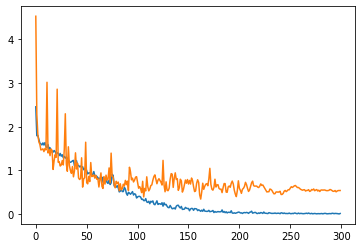

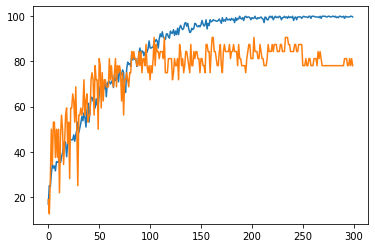

Best accuracy: 90.625


90.625

In [ ]:
torch.autograd.set_detect_anomaly(True)
training_activity(model, train_loader, validation_loader, num_classes, lr=1e-3, lr_ratio=1e-6, numEpoch=300, decay=1e-4, cost_function=cost_function)

In [ ]:
# load the best model
model = torch.load("/model.pth")
# disable model training mode
model.eval()

## 7. Image degradation
> In this section, I examine how different image degradation techniques affect model performance.

In [ ]:
def experiment(name, info, start, end, step, divider, test_lambda):

    print(f"***{name} test***")

    losses = {}
    accs = {}

    for i in range(start, end-1, step):
        validation.dataset.transform = test_lambda(i)

        if (i % divider == 0):
            print(f"{i}{info} {name}:")
            show_samples(validation)

        current_loss, current_acc, _ = validate(model, validation_loader, 0, cost_function, num_classes, show_progress=(i % divider == 0))
        losses[i] = current_loss
        accs[i] = current_acc

    iteration_indices = list(range(start, end-1, step))

    print(f"Accuracy affected by {name}")
    fig, ax = plt.subplots()
    plt.plot(range(len(accs)), list(accs.values()))
    plt.xticks(range(len(iteration_indices)), iteration_indices, rotation = 90)
    plt.show()

    print(f"Loss affected by {name}")
    plt.plot(range(len(losses)), list(losses.values()))
    plt.xticks(range(len(losses)), iteration_indices, rotation = 90)
    plt.show()

### A: JPEG compression
> Lossy compression is applied to images (`.JPEG` encoding) to examine network performance on lower quality images. Multiple compression ratios have been used.

In [ ]:
def JPEGtransform(compression_ratio):

    def JPEGcompression(image):
        outputIoStream = BytesIO()
        image.save(outputIoStream, "JPEG", quality=compression_ratio, optimice=True)
        outputIoStream.seek(0)
        return Image.open(outputIoStream)

    return transforms.Compose(
            [
                transforms.Resize((200, 200)),
                transforms.Lambda(JPEGcompression),
                transforms.ToTensor(),
                # normalization is not needed here as the images are already loaded in the range of [0, 1)
            ]
        )

***JPEG compression ratio test***
100% JPEG compression ratio:


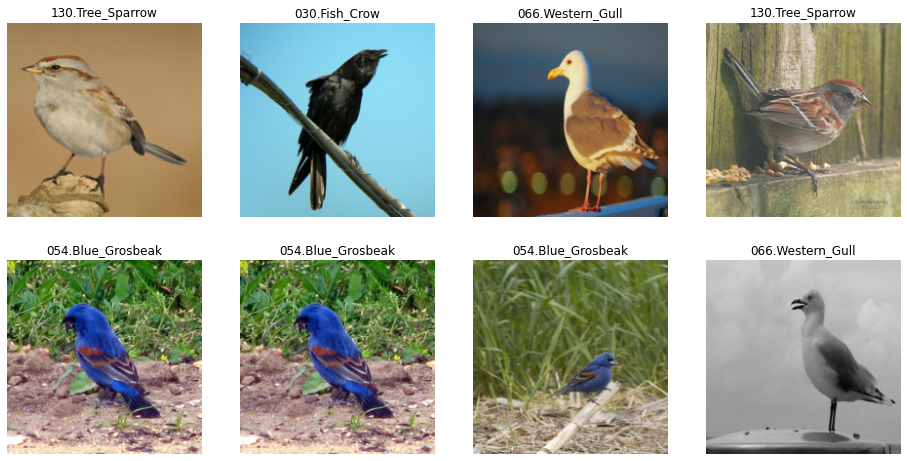

Valid epoch 1 - loss: 0.4914664626121521 accuracy: 90.625
90% JPEG compression ratio:


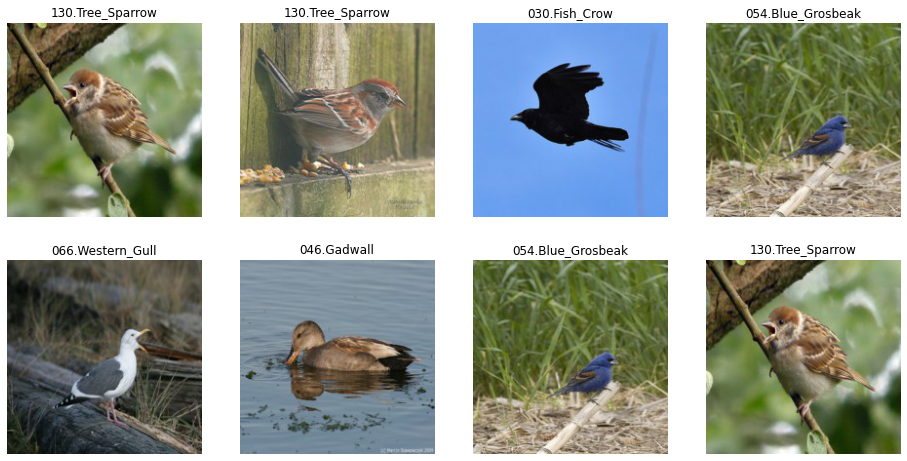

Valid epoch 1 - loss: 0.4908907115459442 accuracy: 90.625
80% JPEG compression ratio:


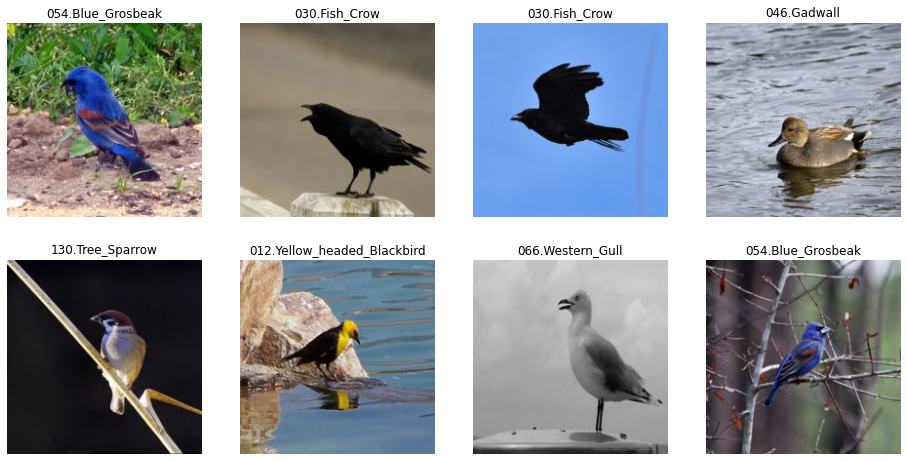

Valid epoch 1 - loss: 0.4928237497806549 accuracy: 90.625
70% JPEG compression ratio:


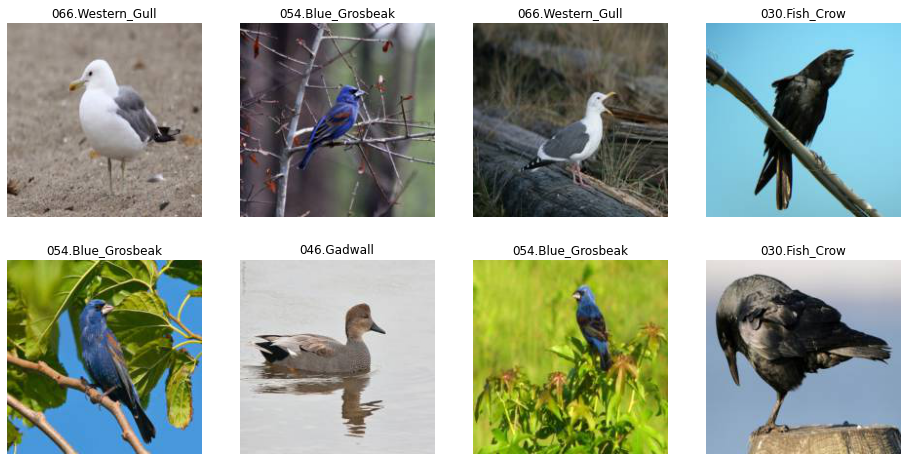

Valid epoch 1 - loss: 0.48405760526657104 accuracy: 90.625
60% JPEG compression ratio:


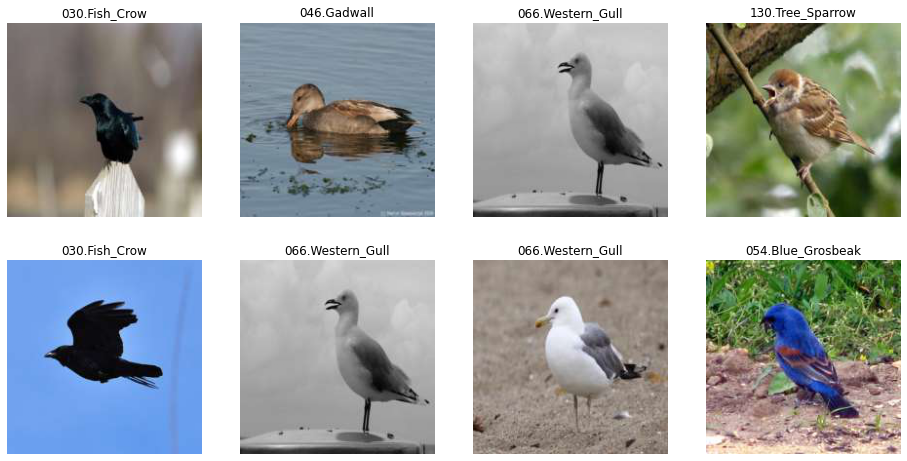

Valid epoch 1 - loss: 0.49031907320022583 accuracy: 90.625
50% JPEG compression ratio:


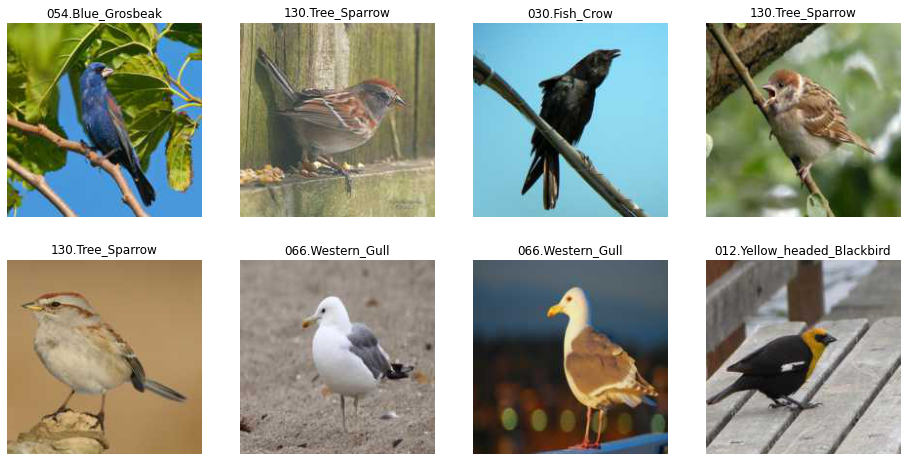

Valid epoch 1 - loss: 0.4859086275100708 accuracy: 90.625
40% JPEG compression ratio:


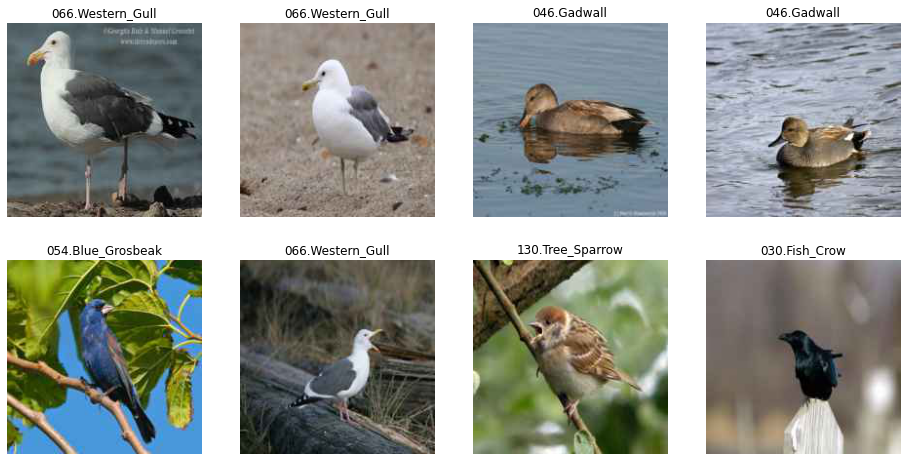

Valid epoch 1 - loss: 0.4932310879230499 accuracy: 90.625
30% JPEG compression ratio:


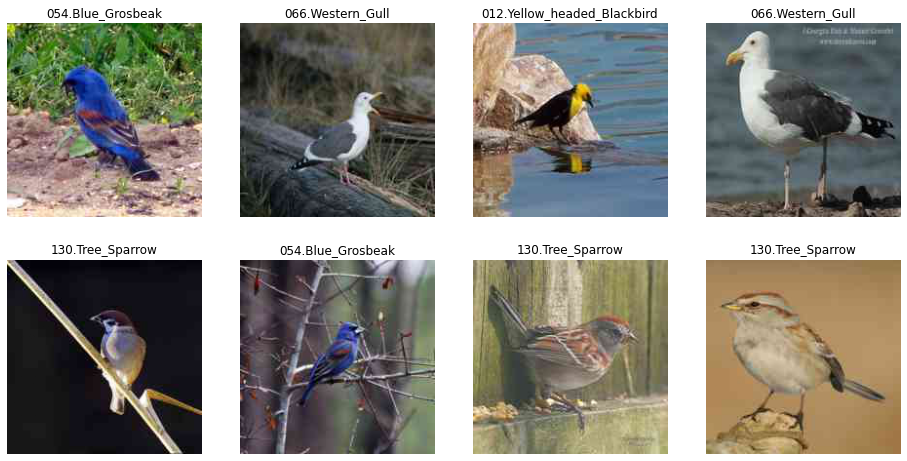

Valid epoch 1 - loss: 0.4746358394622803 accuracy: 90.625
20% JPEG compression ratio:


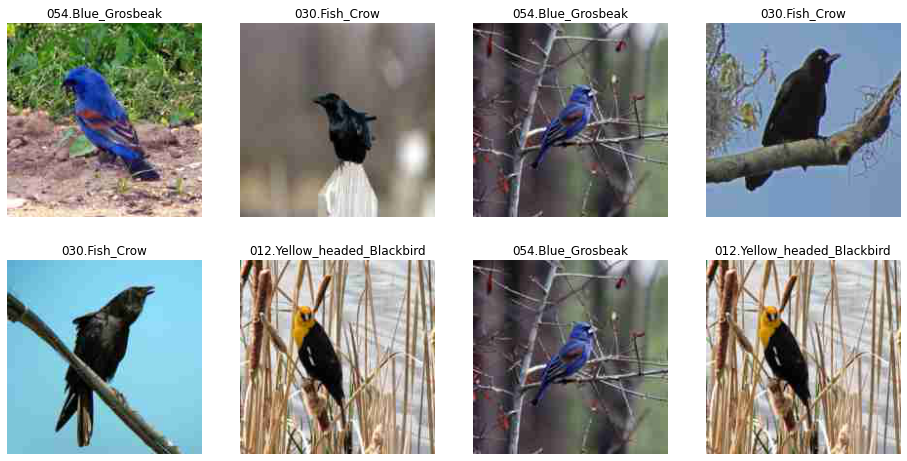

Valid epoch 1 - loss: 0.4748978018760681 accuracy: 90.625
10% JPEG compression ratio:


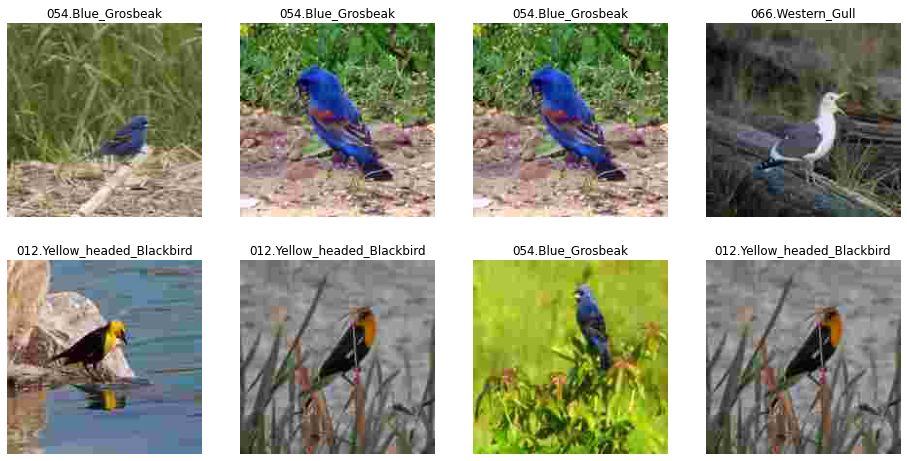

Valid epoch 1 - loss: 0.5278217196464539 accuracy: 87.5
0% JPEG compression ratio:


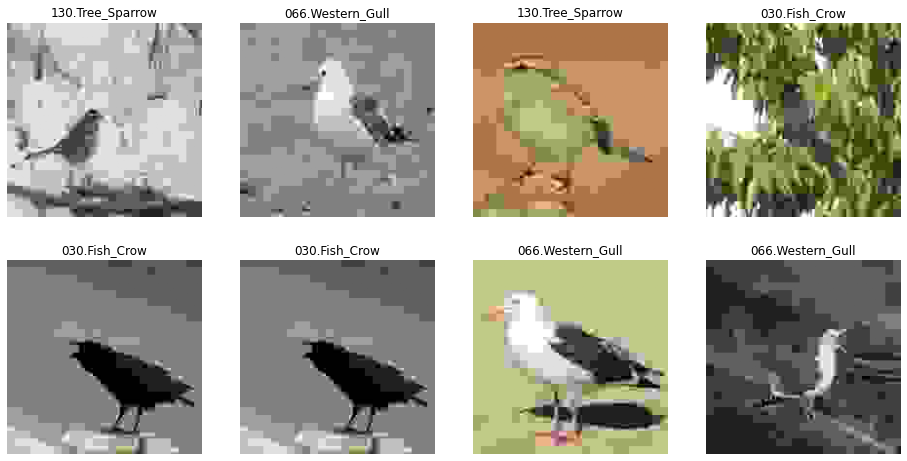

Valid epoch 1 - loss: 1.0772697925567627 accuracy: 59.375
Accuracy affected by JPEG compression ratio


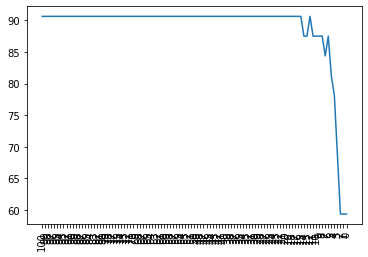

Loss affected by JPEG compression ratio


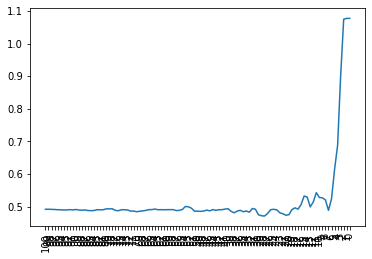

In [ ]:
experiment("JPEG compression ratio", "%", 100, 0, -1, 10, JPEGtransform)

#### Conclusion
> The model does not seem to be affected by the `.JPEG` compression (it was originally trained on `.PNG` images). The accuracy is the same in all cases until `15%` compression ratio. Below that, both loss and accuracy start to drop. Only near to the compression rate of `0%` is where the results drastically getting worse.

### B: Resolution reduction with nearest neighbour
> Reduce image resolution with nearest neighbour, then scale the image back. Multiple resolution ratios have been applied.

In [ ]:
def NearestNeighborReduction(resize_ratio):
    return transforms.Compose(
            [
                transforms.Resize((200, 200)),
                transforms.Resize((200//resize_ratio, 200//resize_ratio), interpolation=transforms.InterpolationMode.NEAREST),
                transforms.Resize((200, 200)),
                transforms.ToTensor(),
                # normalization is not needed here as the images are already loaded in the range of [0, 1)
            ]
        )

***Nearest neighbor reduction test***
2 division Nearest neighbor reduction:


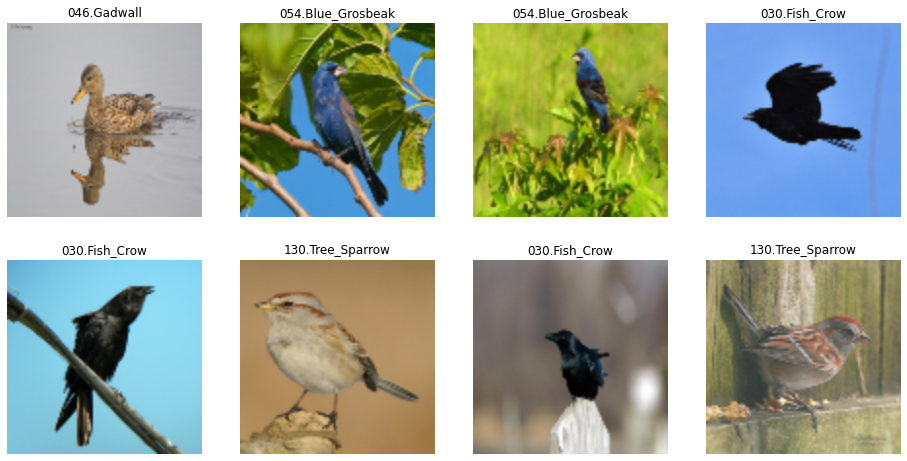

Valid epoch 1 - loss: 0.5166577100753784 accuracy: 90.625
4 division Nearest neighbor reduction:


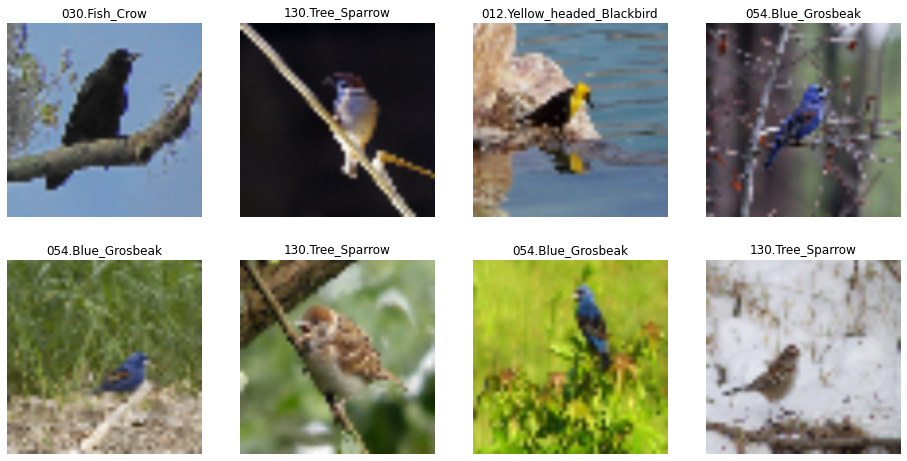

Valid epoch 1 - loss: 0.5772749781608582 accuracy: 87.5
6 division Nearest neighbor reduction:


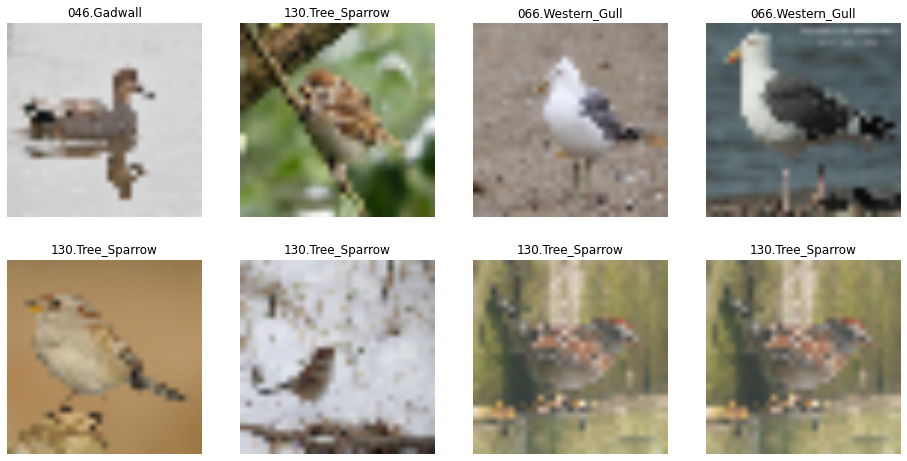

Valid epoch 1 - loss: 0.6951359510421753 accuracy: 84.375
8 division Nearest neighbor reduction:


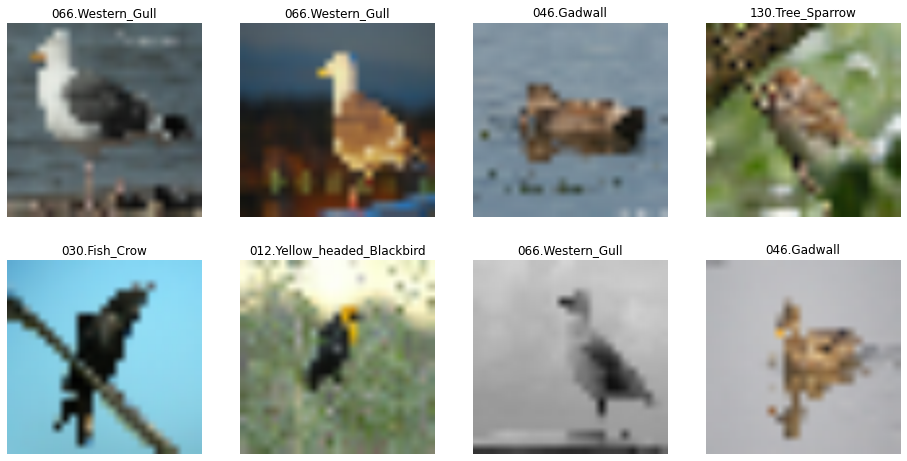

Valid epoch 1 - loss: 0.9019063711166382 accuracy: 84.375
Accuracy affected by Nearest neighbor reduction


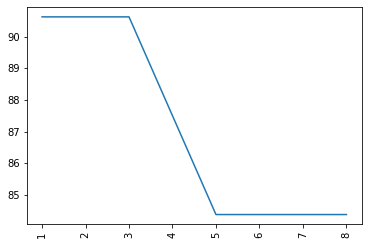

Loss affected by Nearest neighbor reduction


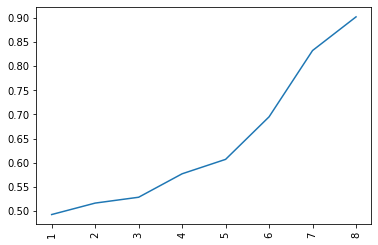

In [ ]:
experiment("Nearest neighbor reduction", " division", 1, 10, 1, 2, NearestNeighborReduction)

#### Conclusion
> Until resizing the image to its `1/4th` size, only the loss increases a bit. After that, accuracy is also affected, but not as much as the loss. It suggests that the model's certainty gets significantly worse (but in these cases the birds were so different that accuracy has not changed much).

### C: Resolution reduction with bilinear interpolation
> Reduce image resolution with bilinear interpolation, then scale the image back. Multiple resolution ratios have been applied.

In [ ]:
def BilinearReduction(resize_ratio):
    return transforms.Compose(
            [
                transforms.Resize((200, 200)),
                transforms.Resize((200//resize_ratio, 200//resize_ratio), interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.Resize((200, 200)),
                transforms.ToTensor(),
                # normalization is not needed here as the images are already loaded in the range of [0, 1)
            ]
        )

***Bilinear interpolation reduction test***
2 division Bilinear interpolation reduction:


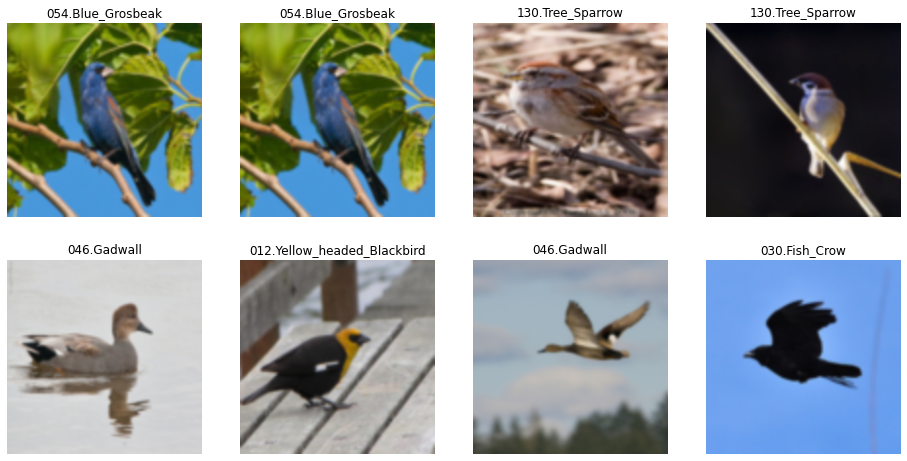

Valid epoch 1 - loss: 0.5635738968849182 accuracy: 90.625
4 division Bilinear interpolation reduction:


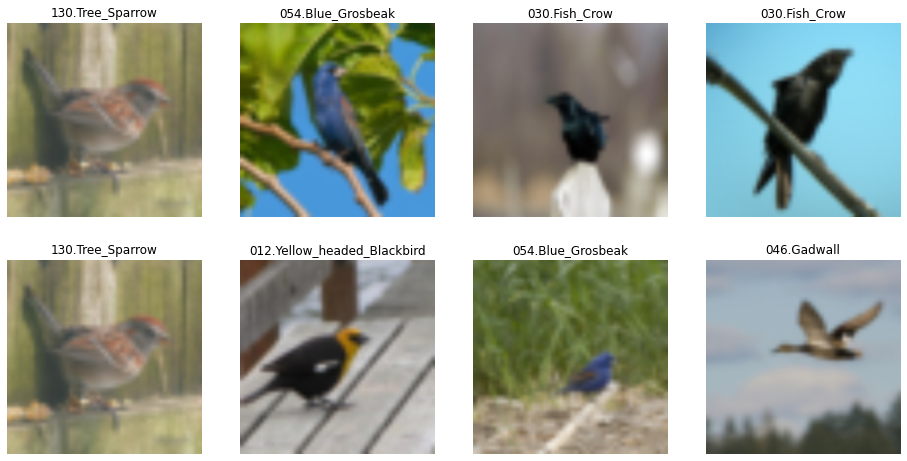

Valid epoch 1 - loss: 0.8908661603927612 accuracy: 81.25
6 division Bilinear interpolation reduction:


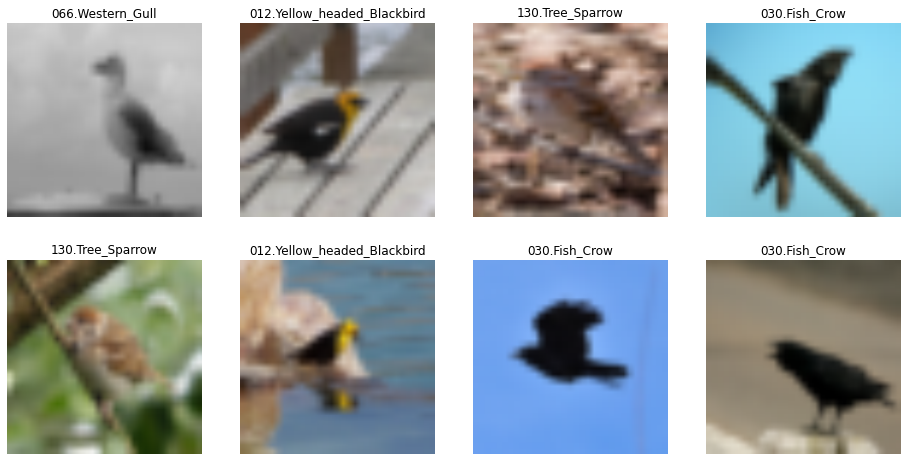

Valid epoch 1 - loss: 1.0795506238937378 accuracy: 68.75
8 division Bilinear interpolation reduction:


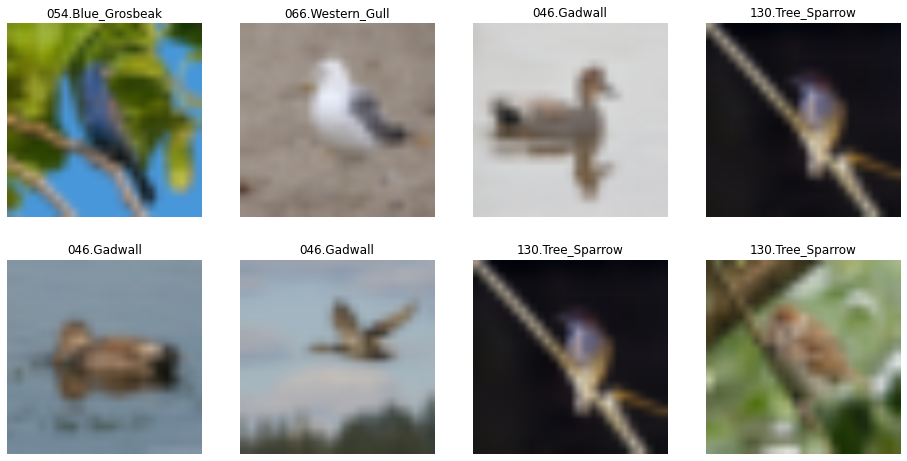

Valid epoch 1 - loss: 1.1821720600128174 accuracy: 65.625
Accuracy affected by Bilinear interpolation reduction


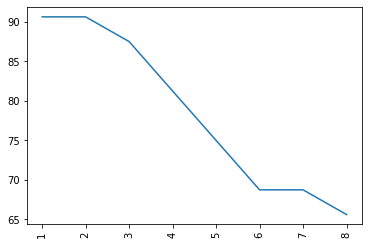

Loss affected by Bilinear interpolation reduction


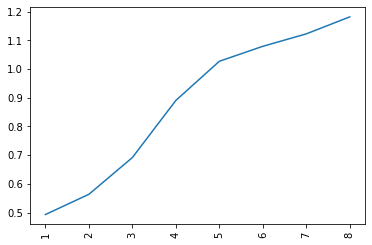

In [ ]:
experiment("Bilinear interpolation reduction", " division", 1, 10, 1, 2, BilinearReduction)

#### Conclusion
> Bilinear interpolation performed worse than nearest neighbour. Loss and also accuracy are affected when resizing to the `1/3rd` of the original size. While accuracy with nearest neighbour dropped by `5%` in the most significant resizing iteration, with bilinear interpolation accuracy dropped by `25%`, which is 5-times the difference. Loss is also worse than with the previous method, but the results here are not as bad as with accuracy (only grew 1.75-times as much as with nearest neighbour).